In [2]:
%load_ext autoreload
%autoreload 2
%matplotlib inline

In [146]:
import numpy as np
import matplotlib.pyplot as plt
from esmpy.datasets.base import generate_spim
from esmpy.estimators import SmoothNMF
from esmpy.measures import find_min_angle, find_min_MSE, ordered_mse, ordered_mae, ordered_r2, ordered_kl
import quadprog
import numpy
from scipy import signal
from scipy.optimize import linprog


In [22]:

def quadprog_solve_qp(P, q, G=None, h=None, A=None, b=None):
    qp_G = .5 * (P + P.T)   # make sure P is symmetric
    qp_a = -q

    if A is not None:
        qp_C = -numpy.vstack([A, G]).T
        qp_b = -numpy.hstack([b, h])
        meq = A.shape[0]
    else:  # no equality constraint
        qp_C = -G.T
        qp_b = -h
        meq = 0
    return quadprog.solve_qp(qp_G, qp_a, qp_C, qp_b, meq)[0]


In [159]:
C = 15
L = 200
P = 100**2
seed = 0

n_poisson = 300 # Average poisson number per pixel (this number will be splitted on the L dimension)
a = np.sum(filter_maps**2)
print((1)/(a+1))


0.9908022676296113


In [9]:

def syntheticG(L=200, C=15, seed=None):

    np.random.seed(seed=seed)
    n_el = 45
    n_gauss = np.random.randint(2, 5,[C])
    l = np.arange(0, 1, 1/L)
    mu_gauss = np.random.rand(n_el)
    sigma_gauss = 1/n_el + np.abs(np.random.randn(n_el))/n_el/5

    G = np.zeros([L,C])

    def gauss(x, mu, sigma):
        # return np.exp(-(x-mu)**2/(2*sigma**2)) / (sigma * np.sqrt(2*np.pi))
        return np.exp(-(x-mu)**2/(2*sigma**2))

    for i, c in enumerate(n_gauss):
        inds = np.random.choice(n_el, size=[c] , replace=False)
        for ind in inds:
            w = 0.1+0.9*np.random.rand()
            G[:,i] += w * gauss(l, mu_gauss[ind], sigma_gauss[ind])
    return G
 
def load_toy_images():
    im1 = plt.imread("../esmpy/datasets/toy-problem/phase1.png")
    im1 = (1-np.mean(im1, axis=2)) *0.5

    im2 = plt.imread("../esmpy/datasets/toy-problem/phase2.png")
    im2 = (1-np.mean(im2, axis=2)) *0.5

    im0 = 1 - im1 - im2 

    Hdot = np.array([im0, im1, im2])

    return Hdot


def create_toy_problem(L, C, n_poisson, seed=None):
    np.random.seed(seed=seed)
    G = syntheticG(L,C, seed=seed) 
    Hdot = load_toy_images()
    K = len(Hdot)
    Hdotflat = Hdot.reshape(K, -1)
    Wdot = np.abs(np.random.laplace(size=[C, K]))
    Wdot = Wdot / np.mean(Wdot)/L
    Ddot = G @ Wdot
    Ydot = Ddot @ Hdotflat

    Y = 1/n_poisson * np.random.poisson(n_poisson * Ydot)
    shape_2d = Hdot.shape[1:]
    return G, Wdot, Ddot, Hdot, Hdotflat, Ydot, Y, shape_2d, K
def plot_results(Ddot, D, Hdotflat, Hflat, n_pixel_side, Hs, Ws, G, losses):

    # avg_r2_losses = []
    # avg_ang_losses = []
    # for i in range(len(losses)):
    #     H_it = Hs[i]
    #     W_it = Ws[i]
    #     D_it = G @ W_it
    #     angles, true_inds = find_min_angle(Ddot.T, D_it.T, unique=True, get_ind=True)
    #     r2 = ordered_r2(Hdotflat, H_it, true_inds)
    #     avg_ang_losses.append(sum(angles)/len(angles))
    #     avg_r2_losses.append(sum(r2)/len(r2))
        

    fontsize = 30
    scale = 15
    aspect_ratio = 1.4
    marker_list = ["-o","-s","->","-<","-^","-v","-d"]
    mark_space = 20
    # cmap = plt.cm.hot_r    
    cmap = plt.cm.gray_r
    vmax = 1
    vmin = 0
    K = Hflat.shape[0]
    L = D.shape[0]

    angles, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)

  

    mse = ordered_mse(Hdotflat, Hflat, true_inds)
    mae = ordered_mae(Hdotflat, Hflat, true_inds)
    r2 = ordered_r2(Hdotflat, Hflat, true_inds)
    kl = ordered_kl(Hdotflat, Hflat, true_inds)
    print(";....................................")
    print(kl)
    Hflat = Hflat[true_inds,:]
    D = D[:,true_inds]
    

    fig = plt.figure(figsize = (scale/K * 3 * aspect_ratio,scale))
    gs = fig.add_gridspec(3,3)
    plt.subplots_adjust(bottom=0.15)
    ax_slide = plt.axes([0.15, 0.1, 0.65, 0.03])
  
    x = np.linspace(0,1, num = L)
    rows = ["True maps","Reconstructed maps","Spectra"]

    for i in range(K): 

        
        ax1 = fig.add_subplot(gs[0, i])
        ax2 = fig.add_subplot(gs[1, i])
        ax3 = fig.add_subplot(gs[2, i])

        if i == 0:                
            ax1.set_ylabel('True maps', rotation=90, fontsize=fontsize)
            ax2.set_ylabel('Reconstructed maps', rotation=90, fontsize=fontsize)
            ax3.set_ylabel('Spectra', rotation=90, fontsize=fontsize)

        
        ax3.plot(x,Ddot.T[i,:],'bo',label='truth',linewidth=4)
        ax3.plot(x,D[:,i],'r-',label='reconstructed',markersize=3.5)
        ax3.set_title("{:.2f} deg".format(angles[true_inds[i]]),fontsize = fontsize-2)
        ax3.set_xlim(0,1)

        ax2.imshow((Hflat[i]).reshape(n_pixel_side,n_pixel_side),vmin = vmin, vmax = vmax , cmap=cmap)
        ax2.set_title("R2: {:.2f}".format(r2[i]),fontsize = fontsize-2)
        # axes[i,1].set_ylim(0.0,1.0)
        ax2.tick_params(axis = "both",labelleft = False, labelbottom = False,left = False, bottom = False)

        im = ax1.imshow(Hdotflat[i].reshape(n_pixel_side,n_pixel_side),vmin = vmin, vmax = vmax, cmap=cmap)
        ax1.set_title("Phase {}".format(i),fontsize = fontsize)
        ax1.tick_params(axis = "both",labelleft = False, labelbottom = False,left = False, bottom = False)
        ax3.legend()

       

    # Merge the bottom cells of the figure and plot the losses
    # ax4 = fig.add_subplot(gs[3, :])
    # ax4.set_ylabel('R2 Losses')
    # ax4.set_xlabel('Iteration')
    # ax4.plot(avg_r2_losses)

    # ax5 = fig.add_subplot(gs[4, :])
    # ax5.set_ylabel('Angle lesses')
    # ax5.set_xlabel('Iteration')
    # ax5.plot(avg_ang_losses)

    # ax6 = fig.add_subplot(gs[5, :])
    # ax6.set_ylabel('Losses')
    # ax6.set_xlabel('Iteration')
    # ax6.plot(losses)

    # for ax, row in zip(axes[:,0], rows):
    #     ax.set_ylabel(row, rotation=90, fontsize=fontsize)


    fig.subplots_adjust(right=0.84)
    # put colorbar at desire position
    cbar_ax = fig.add_axes([0.85, 0.5, 0.01, 0.3])
    fig.colorbar(im,cax=cbar_ax)
    fig.savefig('../results/figure.png')



# Create a synthetic problem

Text(0.5, 1.0, 'Spectral response of each elements')

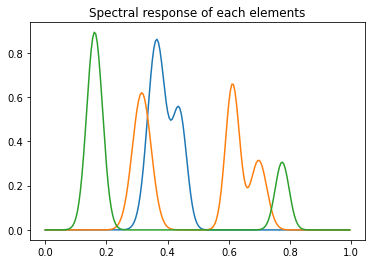

In [160]:
G = syntheticG(L,C, seed)
l = np.arange(0, 1, 1/L)
plt.plot(l, G[:,:3])
plt.title("Spectral response of each elements")


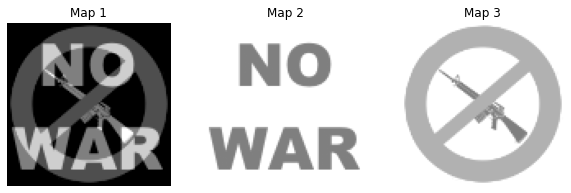

In [161]:

Hdot = load_toy_images()
vmin, vmax = 0,1
cmap = plt.cm.gray_r
plt.figure(figsize=(10, 3))
for i, hdot in enumerate(Hdot):
    plt.subplot(1,3,i+1)
    plt.imshow(hdot, cmap=cmap, vmin=vmin, vmax=vmax)
    plt.axis("off")
    plt.title(f"Map {i+1}")


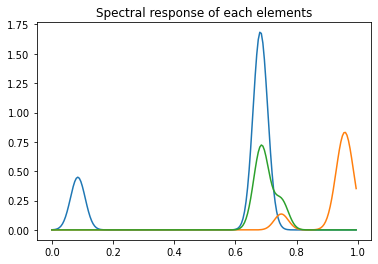

In [162]:
np.random.seed(1)
n_poisson = 300 # Average poisson number per pixel (this number will be splitted on the L dimension)

G, Wdot, Ddot, Hdot, Hdotflat, Ydot, Y, shape_2d, K = create_toy_problem(L, C, n_poisson, seed=1)
l = np.arange(0, 1, 1/L)
plt.plot(l, G[:,:3])
plt.title("Spectral response of each elements")

YVol = Y.reshape(200,100,100)


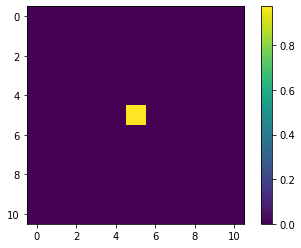

1.0


In [253]:
# Smooth maps 

N = np.zeros((90*90*200, 11*11), dtype = np.float32)
b = np.zeros((90*90*200), dtype = np.float32)
for i_ in range(200):
    for i in range(5,95):
        for j in range(5,95):
            flattened_img = YVol[i_,i-5:i+6,j-5:j+6].flatten()
            N[(i-5)*90+(j-5)+90*90*i_,:] = flattened_img
            b[(i-5)*90+(j-5)+90*90*i_] = YVol[i_,i,j]

P = 2*N.T@N
q = -2*N.T@b
G = -np.eye(121)
h = np.zeros((121,))
A = np.zeros((2,121))
A[0,:] = np.ones(121)
A[1,121//2] = 1
b = np.zeros((2,))
b[0] = 1

filter_maps = quadprog_solve_qp(np.array(P, dtype=np.double),np.array(q, dtype=np.double), G=np.array(G, dtype=np.double), h=np.array(h, dtype=np.double), A=np.array(A, dtype=np.double), b=np.array(b, dtype=np.double))
filter_maps = filter_maps.reshape(11,11)
plt.imshow(filter_maps)
plt.colorbar()
plt.show()

# res = res.reshape(11,11)
# f1 = signal.convolve2d(im1, res, boundary='symm', mode='same')
# plt.imshow(f1)
# plt.colorbar()
# plt.show()

# plt.imshow(0.8*f1 + 0.2*im1)
# plt.colorbar()
# plt.show()
print(np.sum(filter_maps))


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


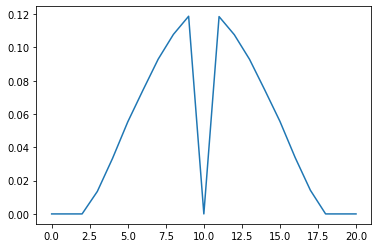

In [164]:
# Smooth spectras

N = np.zeros((90*90*200, 21), dtype = np.float32)
b = np.zeros((90*90*200), dtype = np.float32)
for i_ in range(10,190):
    for i in range(100):
        for j in range(100):
            flattened_img = YVol[i_-10:i_+11,i,j].flatten()
            N[(i)*90+(j)+90*90*(i_-10),:] = flattened_img
            b[(i)*90+(j)+90*90*(i_-10)] = YVol[i_,i,j]
P = 2*N.T@N
q = -2*N.T@b
G = -np.eye(21)
h = np.zeros((21,))
A = np.zeros((1,21))
A[0,21//2] = 1
b = np.zeros((1,))
print(A)

filter_spectras = quadprog_solve_qp(np.array(P, dtype=np.double),np.array(q, dtype=np.double), G=np.array(G, dtype=np.double), h=np.array(h, dtype=np.double), A=np.array(A, dtype=np.double), b=np.array(b, dtype=np.double))
plt.plot(filter_spectras)
plt.show()

0.987521452391965
0.012624185275304067
1.1164968910510207
0.00632988359453039 0.006329883333333331 0.006329883608277602
1.982569154076576e-05 1.9825692478990522e-05
1.1152239436638027
0.006329883594805326 0.006329883333333331 0.006329883608277602
1.982358349865101e-05 1.9823584419079116e-05
1.1140223448483328
0.006329883595080273 0.006329883333333331 0.006329883608277602
1.9821518909056883e-05 1.9821519811648836e-05
1.1128920946046112
0.006329883595355219 0.006329883333333331 0.006329883608277602
1.981949777198337e-05 1.9819498656699677e-05
1.1118331929326384
0.0063298835956301655 0.006329883333333331 0.006329883608277602
1.9817520087430493e-05 1.981752095423164e-05
1.1108456398324127
0.006329883595905106 0.006329883333333331 0.006329883608277602
1.981558585539826e-05 1.9815586704244733e-05
1.1099294353039364
0.006329883596180051 0.006329883333333331 0.006329883608277602
1.981369507588664e-05 1.981369590673895e-05
1.1090845793472077
0.006329883596454998 0.006329883333333331 0.006329883

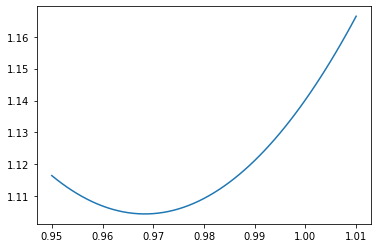

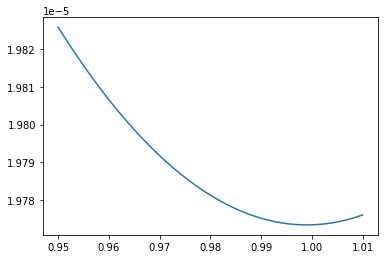

In [249]:
losses = []
variances = []
YdotVol = Ydot.reshape(200,100,100)
alphas = np.arange(0.95,1.01,0.001)
YSmoothedMaps = np.zeros((200,100,100))
filter_maps_flattened = filter_maps.flatten()
for c in range(200):
    # print(Y[c,:,:].shape,, res.shape)
    YSmoothedMaps[c,:,:] = signal.convolve2d(YVol[c,:,:], filter_maps, boundary='symm', mode='same')
YSmoothedSpectra = np.zeros((200,100,100))
for i in range(100):
    for j in range(100):
    # print(Y[c,:,:].shape,, res.shape)
        YSmoothedSpectra[:,i,j] = signal.convolve(YVol[:,i,j], filter_spectras, mode='same')


a = np.sum(N*filter_maps_flattened*filter_maps_flattened, axis=1)
print(np.mean((N[1000,(11*11)//2])/(a[1000]+N[1000,(11*11)//2]+0.0000000000000000001)))

print(1-1/(1+np.sum(filter_maps_flattened*filter_maps_flattened)))

for i in range(len(alphas)):
    alpha = alphas[i]
    YMix =  YVol*(1-alpha)+ YSmoothedMaps*(alpha)
    loss = np.sum((YdotVol[:,5:95,5:95]-YMix[:,5:95,5:95])**2)
    print(loss)
    print(np.mean(YMix), np.mean(YVol), np.mean(YSmoothedMaps))
    print(np.var(YMix),(1-alpha)**2*np.var(YVol) + alpha**2* np.var(YSmoothedMaps) + 2*cov[1,0]*alpha*(1-alpha))
    variances.append(np.var(YMix))
    losses.append(loss)

plt.plot(alphas,losses)
plt.show()

plt.plot(alphas, variances)
plt.show()

alpha = 0.1

YSmoothedMapsMix =  YVol*(1-alpha)+ YSmoothedMaps*(alpha)
YSmoothedSpectraMix =  YVol*(1-alpha)+ YSmoothedSpectra*(alpha)



In [252]:
print(np.mean(filter_maps_flattened))

0.008264462809917357


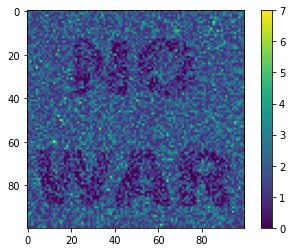

(1620000, 1331) (1620000,)
(1331, 1331) (1331,) (121, 121) (121,) (121,) (1,)
(1331, 1331) (1331,) (121, 121) (121,)


ValueError: G and C must have the same first dimension. Received G as (1331,1331) and C as (121, 121)

In [ ]:

# X = np.zeros((90*90*200, 11*11*11), dtype = np.float32)
# b = np.zeros((90*90*200), dtype = np.float32)
# for i_ in range(5,195):
#     for i in range(5,95):
#         for j in range(5,95):
#             flattened_img = YVol[i_-5:i_+6,i-5:i+6,j-5:j+6].flatten()
#             X[(i-5)*90+(j-5)+90*90*(i_-5),:] = flattened_img
#             b[(i-5)*90+(j-5)+90*90*(i_-5)] = YVol[i_,i,j]

# print(X.shape,b.shape)
# P = 2*X.T@X
# q = -2*X.T@b
# G = -np.eye(121*11)
# G[(121**11)//2,(121**11)//2] = 1
# h = np.zeros(((121**11),))
# A = np.ones(((121**11),))
# b = np.ones((1,))
# print(P.shape, q.shape, G.shape, h.shape, A.shape, b.shape)

# res = quadprog_solve_qp(np.array(P, dtype=np.double),np.array(q, dtype=np.double), G=np.array(G, dtype=np.double), h=np.array(h, dtype=np.double))
# plt.imshow(res.reshape(11,11))
# plt.colorbar()
# plt.show()

# res = res.reshape(11,11)
# f1 = signal.convolve2d(im1, res, boundary='symm', mode='same')
# plt.imshow(f1)
# plt.colorbar()
# plt.show()



# plt.imshow(0.8*f1 + 0.2*im1)
# plt.colorbar()
# plt.show()



(100, 100) (121,)


ValueError: convolve2d inputs must both be 2-D arrays

In [127]:
losses = []
YdotVol = Ydot.reshape(200,100,100)
alphas = np.arange(0.9,1,0.01)
for i in range(len(alphas)):
    alpha = alphas[i]
    smoothedY = np.zeros((200,100,100))
    for c in range(200):
        # print(Y[c,:,:].shape,, res.shape)
        smoothedY[c,:,:] = signal.convolve2d(Y[c,:,:], res, boundary='symm', mode='same')
    smoothedY =  Y*(1-alpha)+ smoothedY*(alpha)
    loss = np.sum(np.abs(YdotVol-smoothedY)**2)
    print(loss)

    losses.append(loss)

plt.plot(alphas,losses)
plt.show()

alpha = 0.1
smoothedY = np.zeros((200,100,100))
for c in range(200):
    # print(Y[c,:,:].shape,, res.shape)
    smoothedY[c,:,:] = signal.convolve2d(Y[c,:,:], res, boundary='symm', mode='same')
smoothedY =  Y*(1-alpha)+ smoothedY*(alpha)

Y = Y.reshape(200,100,100)



IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  132.901 it/s
It 20 / 100: loss 0.000,  146.284 it/s
It 30 / 100: loss 0.000,  162.649 it/s
It 40 / 100: loss 0.000,  172.998 it/s
It 50 / 100: loss 0.000,  178.239 it/s
exits because of relative change < tol: 0.00020379604165465755
exits because of relative change < tol: 0.00018838284026837264
exits because of relative change < tol: 0.00017432785343307098
exits because of relative change < tol: 0.0001615242315787594
exits because of relative change < tol: 0.00014986900405061278
exits because of relative change < tol: 0.00013926371964444084
exits because of relative change < tol: 0.0001296150624770172
It 60 / 100: loss 0.000,  179.942 it/s
exits because of relative change < tol: 0.00012083536309590453
exits because of relative change < tol: 0.0001128429596653035
exits because of relative change < tol: 0.00010556238953721126
exits because of relative change < tol: 9.892442001758066e-05
exits because of relative change < tol: 9.286593437052886e-05
exits because o

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  199.584 it/s
It 20 / 100: loss 0.000,  200.004 it/s
It 30 / 100: loss 0.000,  200.724 it/s
It 40 / 100: loss 0.000,  202.048 it/s
It 50 / 100: loss 0.000,  203.608 it/s
exits because of relative change < tol: 0.0002029051411550794
exits because of relative change < tol: 0.00018748892287749941
exits because of relative change < tol: 0.00017345765261628736
exits because of relative change < tol: 0.00016069686910959017
exits because of relative change < tol: 0.00014909708583895424
exits because of relative change < tol: 0.00013855458965671556
It 60 / 100: loss 0.000,  201.718 it/s
exits because of relative change < tol: 0.00012897205861439804
exits because of relative change < tol: 0.00012025896394426326
exits because of relative change < tol: 0.00011233176113633859
exits because of relative change < tol: 0.00010511388691081287
exits because of relative change < tol: 9.853559656485531e-05
exits because of relative change < tol: 9.25336767521362e-05
exits because 

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  196.055 it/s
It 20 / 100: loss 0.000,  200.314 it/s
It 30 / 100: loss 0.000,  199.706 it/s
It 40 / 100: loss 0.000,  200.443 it/s
It 50 / 100: loss 0.000,  197.401 it/s
exits because of relative change < tol: 0.00021107206159619212
exits because of relative change < tol: 0.000195606495779768
exits because of relative change < tol: 0.00018151885278693556
exits because of relative change < tol: 0.00016869154376892767
exits because of relative change < tol: 0.00015701261965572684
It 60 / 100: loss 0.000,  195.472 it/s
exits because of relative change < tol: 0.0001463766746178783
exits because of relative change < tol: 0.00013668546554429422
exits because of relative change < tol: 0.00012784824957416766
exits because of relative change < tol: 0.00011978187152070758
exits because of relative change < tol: 0.0001124106367908858
exits because of relative change < tol: 0.00010566602705550312
exits because of relative change < tol: 9.948629757597691e-05
exits because o

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  212.454 it/s
It 20 / 100: loss 0.000,  213.769 it/s
It 30 / 100: loss 0.000,  207.414 it/s
It 40 / 100: loss 0.000,  210.443 it/s
It 50 / 100: loss 0.000,  206.696 it/s
exits because of relative change < tol: 0.00021660644752729123
exits because of relative change < tol: 0.00020081748447536634
exits because of relative change < tol: 0.00018641454976517995
exits because of relative change < tol: 0.00017328286546670945
It 60 / 100: loss 0.000,  208.716 it/s
exits because of relative change < tol: 0.00016131235150642902
exits because of relative change < tol: 0.0001503987693876916
exits because of relative change < tol: 0.00014044453576832758
exits because of relative change < tol: 0.0001313592114881262
exits because of relative change < tol: 0.00012305969682986994
exits because of relative change < tol: 0.00011547018737209428
exits because of relative change < tol: 0.00010852193884486661
exits because of relative change < tol: 0.00010215290130264835
exits becaus

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  171.311 it/s
It 20 / 100: loss 0.000,  182.112 it/s
It 30 / 100: loss 0.000,  192.138 it/s
It 40 / 100: loss 0.000,  196.840 it/s
It 50 / 100: loss 0.000,  182.490 it/s
exits because of relative change < tol: 0.00022672500245539054
exits because of relative change < tol: 0.00021044525705154736
exits because of relative change < tol: 0.00019556007680141406
It 60 / 100: loss 0.000,  173.477 it/s
exits because of relative change < tol: 0.0001819612705109889
exits because of relative change < tol: 0.00016954321368067192
exits because of relative change < tol: 0.00015820434489530798
exits because of relative change < tol: 0.00014784835061692022
exits because of relative change < tol: 0.00013838500237630077
exits because of relative change < tol: 0.00012973066655361853
exits because of relative change < tol: 0.0001218085162684262
exits because of relative change < tol: 0.00011454850661453377
exits because of relative change < tol: 0.00010788715856414664
exits becaus

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  209.991 it/s
It 20 / 100: loss 0.000,  223.899 it/s
It 30 / 100: loss 0.000,  216.110 it/s
It 40 / 100: loss 0.000,  219.559 it/s
It 50 / 100: loss 0.000,  219.689 it/s
exits because of relative change < tol: 0.00022991582232606181
It 60 / 100: loss 0.000,  218.044 it/s
exits because of relative change < tol: 0.00021456487721076243
exits because of relative change < tol: 0.00020050724088473414
exits because of relative change < tol: 0.00018764897539885322
exits because of relative change < tol: 0.00017589599797539308
exits because of relative change < tol: 0.00016515576503984362
exits because of relative change < tol: 0.00015533875162480372
exits because of relative change < tol: 0.00014635964233899895
exits because of relative change < tol: 0.00013813821491028087
exits because of relative change < tol: 0.00013059991558522023
exits because of relative change < tol: 0.000123676164541896
It 70 / 100: loss 0.000,  211.261 it/s
exits because of relative change < t

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  179.222 it/s
It 20 / 100: loss 0.000,  184.737 it/s
It 30 / 100: loss 0.000,  183.645 it/s
It 40 / 100: loss 0.000,  182.923 it/s
It 50 / 100: loss 0.000,  181.150 it/s
It 60 / 100: loss 0.000,  183.295 it/s
exits because of relative change < tol: 0.00023562713450751388
exits because of relative change < tol: 0.00021966934932361382
exits because of relative change < tol: 0.0002048787342501063
exits because of relative change < tol: 0.00019120293748130959
exits because of relative change < tol: 0.0001785840212801915
exits because of relative change < tol: 0.00016695973977693733
exits because of relative change < tol: 0.00015626508055173693
exits because of relative change < tol: 0.0001464338637253055
exits because of relative change < tol: 0.00013740023987307388
It 70 / 100: loss 0.000,  187.269 it/s
exits because of relative change < tol: 0.00012909998218105226
exits because of relative change < tol: 0.00012147152073498943
exits because of relative change < to

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  238.588 it/s
It 20 / 100: loss 0.000,  228.864 it/s
It 30 / 100: loss 0.000,  221.379 it/s
It 40 / 100: loss 0.000,  223.666 it/s
It 50 / 100: loss 0.000,  221.791 it/s
It 60 / 100: loss 0.000,  219.386 it/s
exits because of relative change < tol: 0.0002560953197737703
exits because of relative change < tol: 0.0002408000521014204
exits because of relative change < tol: 0.0002262573290505089
exits because of relative change < tol: 0.0002124937250965436
exits because of relative change < tol: 0.00019952888753139693
exits because of relative change < tol: 0.00018737302541351462
It 70 / 100: loss 0.000,  217.825 it/s
exits because of relative change < tol: 0.0001760256507505773
exits because of relative change < tol: 0.0001654754367784043
exits because of relative change < tol: 0.00015570096292924238
exits because of relative change < tol: 0.0001466720875098522
exits because of relative change < tol: 0.00013835169409501396
exits because of relative change < tol: 0

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  209.935 it/s
It 20 / 100: loss 0.000,  213.213 it/s
It 30 / 100: loss 0.000,  218.544 it/s
It 40 / 100: loss 0.000,  219.531 it/s
It 50 / 100: loss 0.000,  218.773 it/s
It 60 / 100: loss 0.000,  217.162 it/s
exits because of relative change < tol: 0.0002648091027763776
exits because of relative change < tol: 0.0002555459982777055
exits because of relative change < tol: 0.00024730160222101954
exits because of relative change < tol: 0.00023999794238930403
exits because of relative change < tol: 0.00023355781065467822
exits because of relative change < tol: 0.00022790248055419668
It 70 / 100: loss 0.000,  215.761 it/s
exits because of relative change < tol: 0.00022294961464974965
exits because of relative change < tol: 0.00021861149987977647
exits because of relative change < tol: 0.00021479376411417573
exits because of relative change < tol: 0.00021139472057603098
exits because of relative change < tol: 0.00020830549039287577
exits because of relative change < t

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  204.763 it/s
It 20 / 100: loss 0.000,  209.637 it/s
It 30 / 100: loss 0.000,  207.899 it/s
It 40 / 100: loss 0.000,  217.348 it/s
It 50 / 100: loss 0.000,  213.290 it/s
It 60 / 100: loss 0.000,  213.519 it/s
exits because of relative change < tol: 0.0002665651138159306
exits because of relative change < tol: 0.000249490372928168
exits because of relative change < tol: 0.0002334337566320669
exits because of relative change < tol: 0.0002183859733354324
It 70 / 100: loss 0.000,  215.787 it/s
exits because of relative change < tol: 0.00020433037343535606
exits because of relative change < tol: 0.00019124228104420028
exits because of relative change < tol: 0.00017908920083054255
exits because of relative change < tol: 0.00016783168187265707
exits because of relative change < tol: 0.00015742463000504266
exits because of relative change < tol: 0.00014781884530340922
exits because of relative change < tol: 0.0001389626106932936
exits because of relative change < tol: 

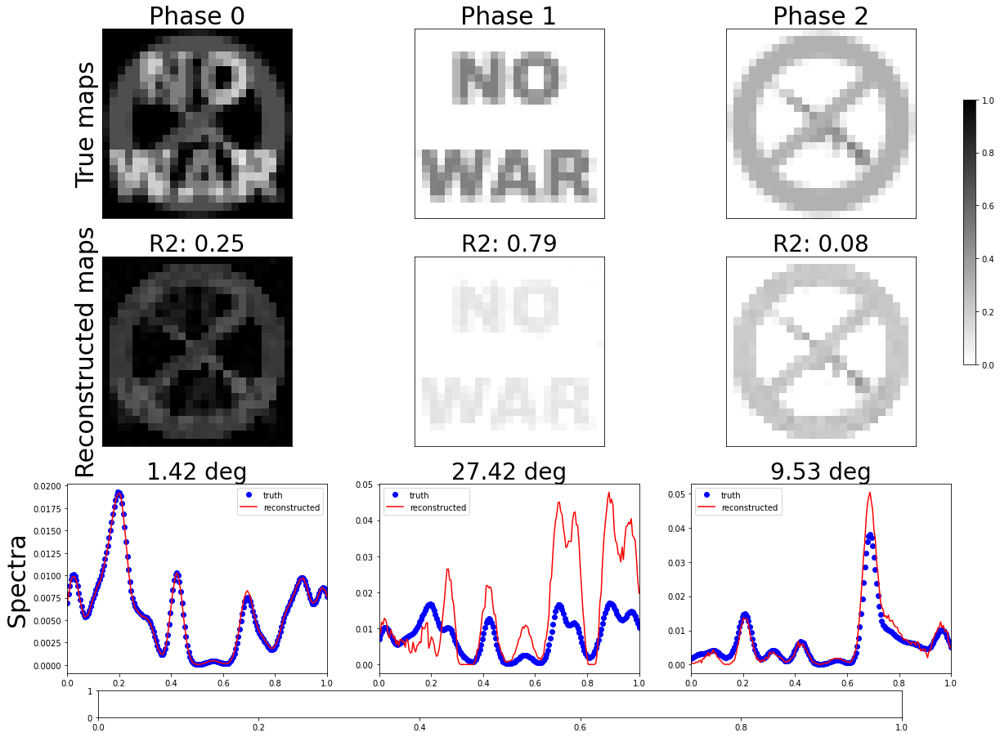

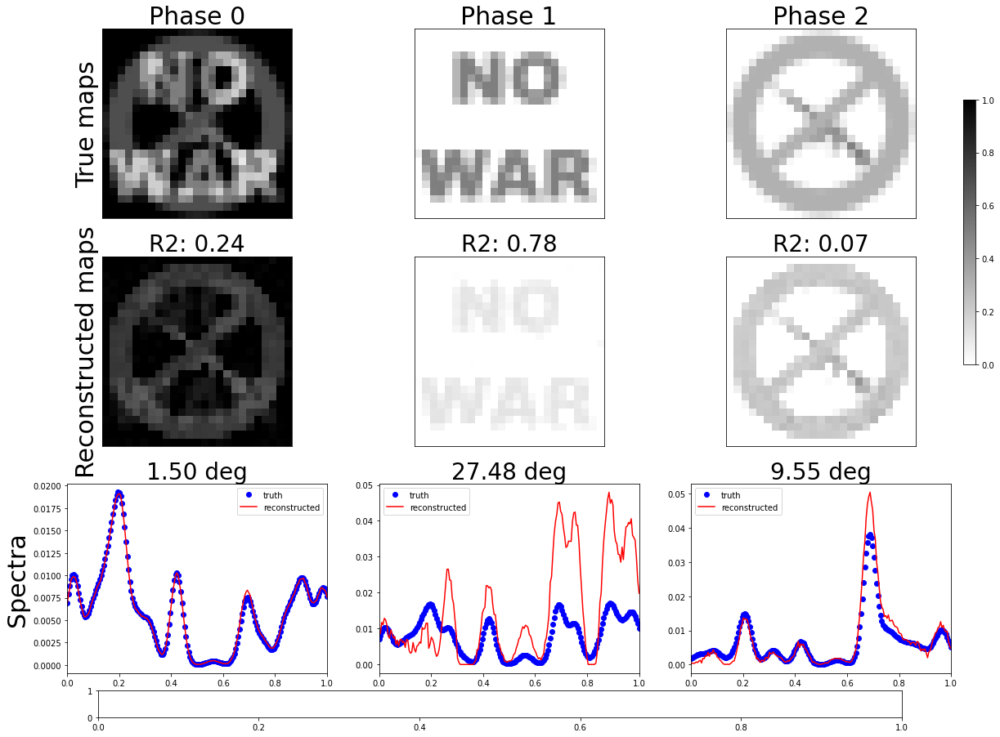

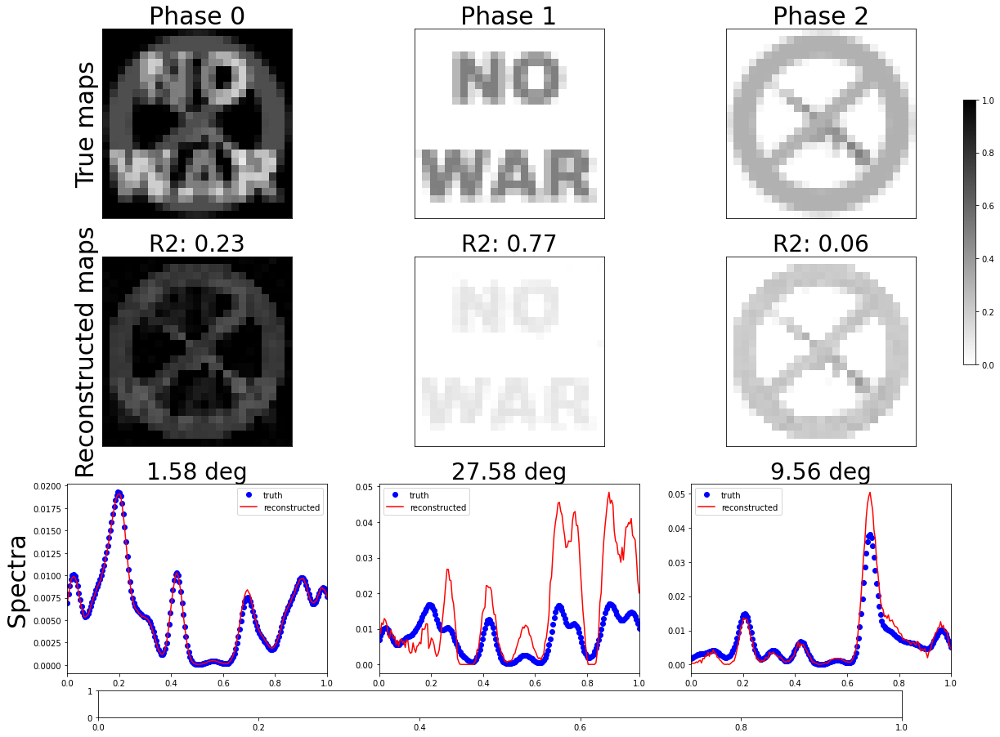

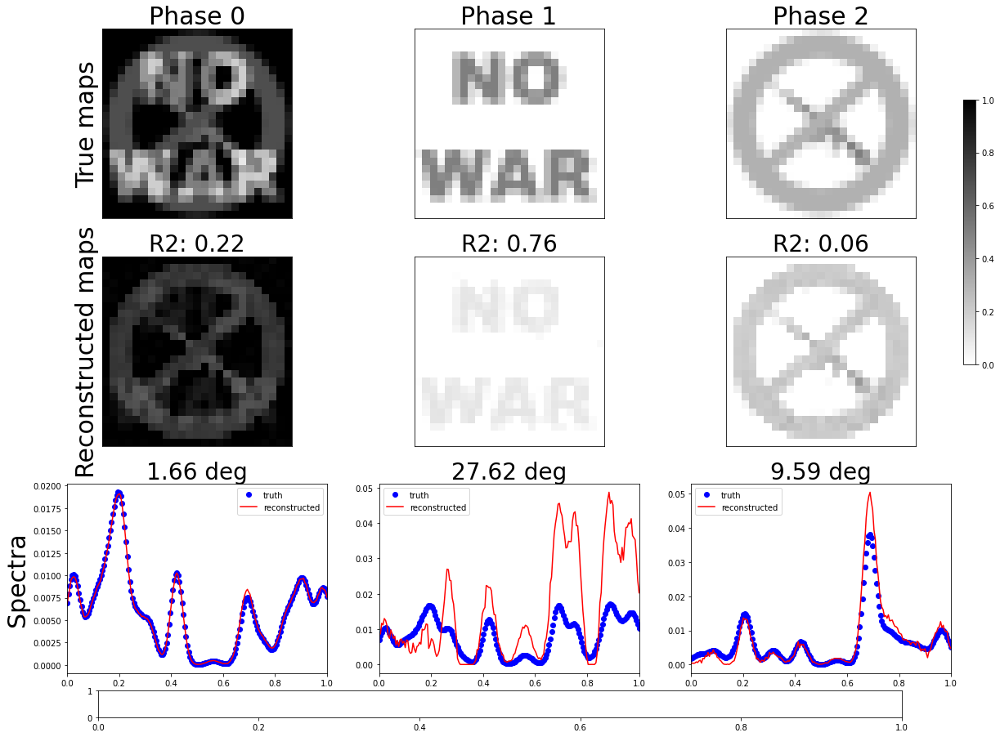

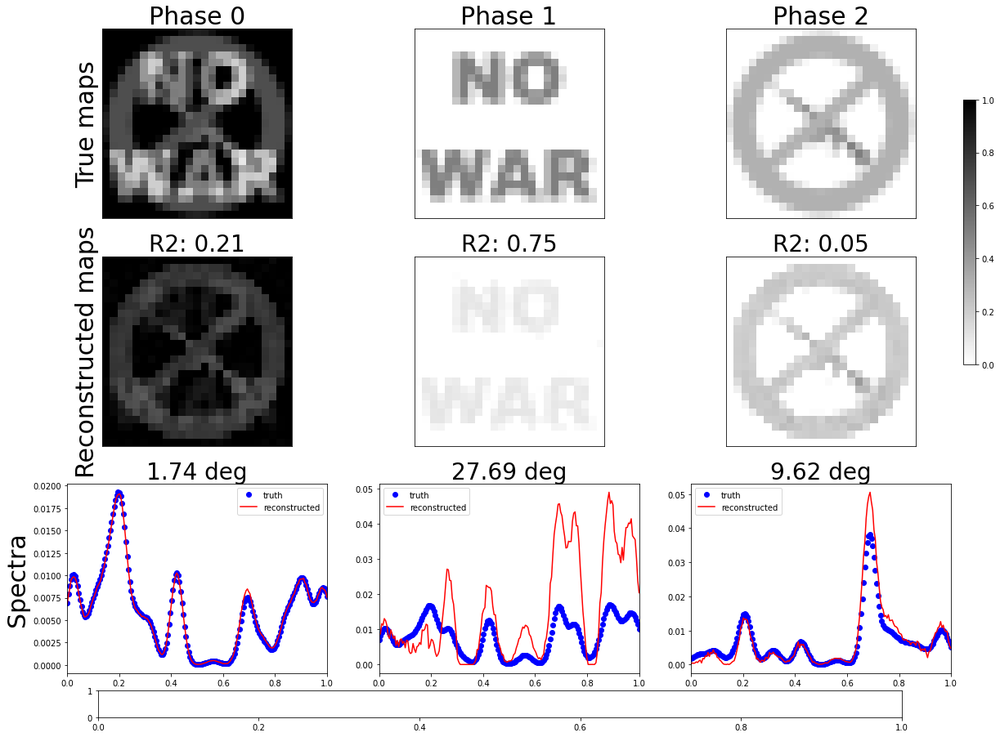

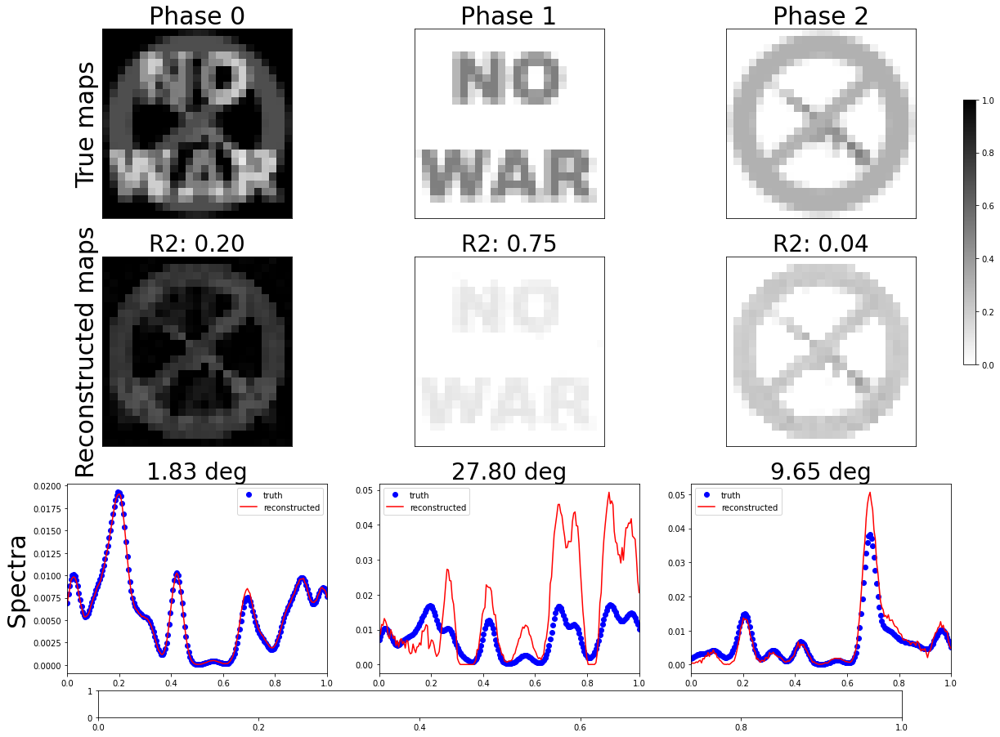

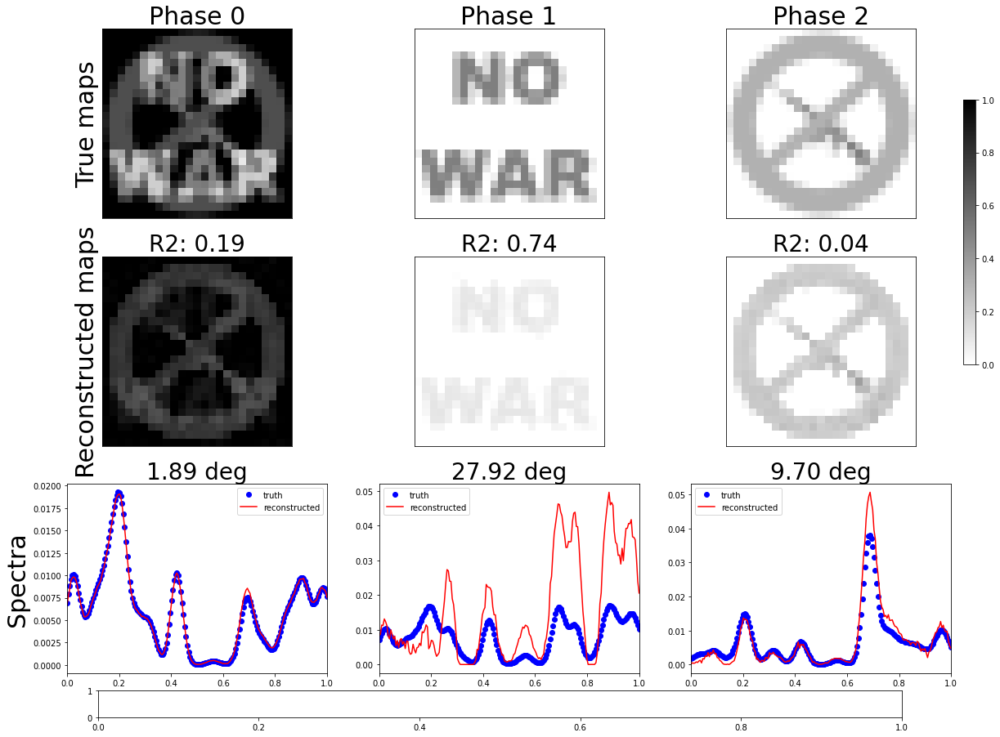

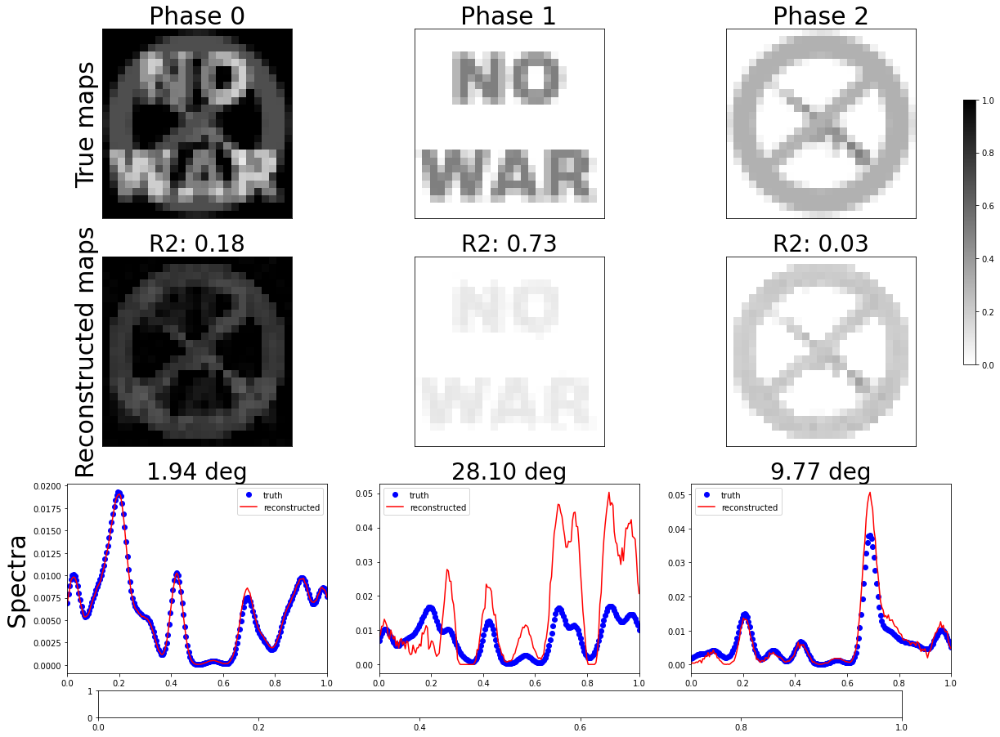

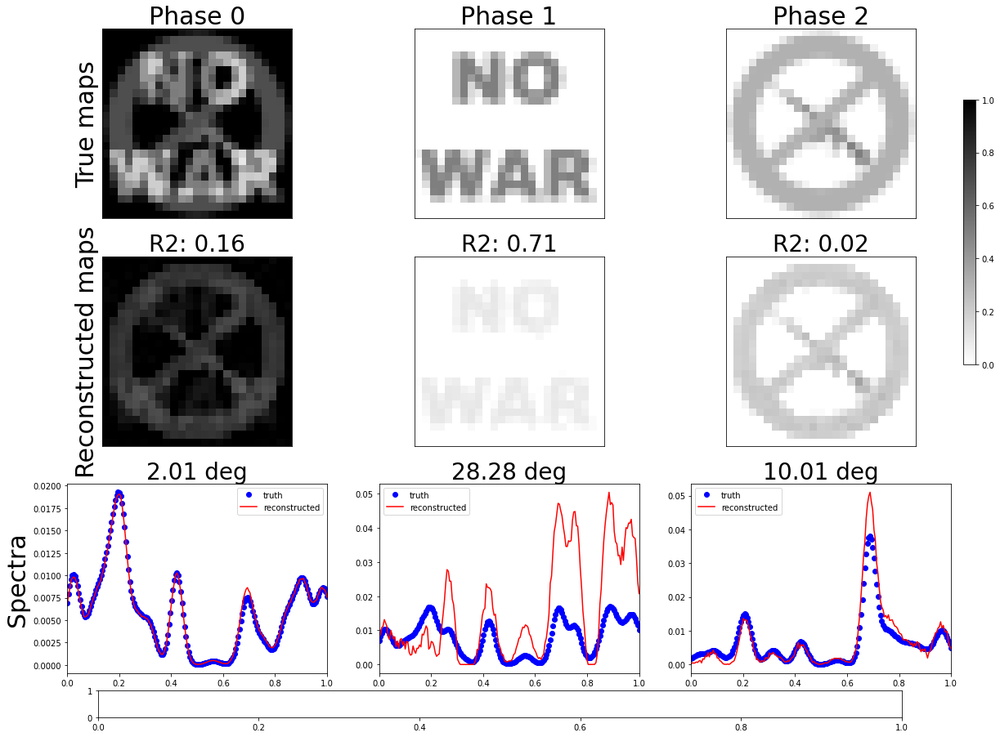

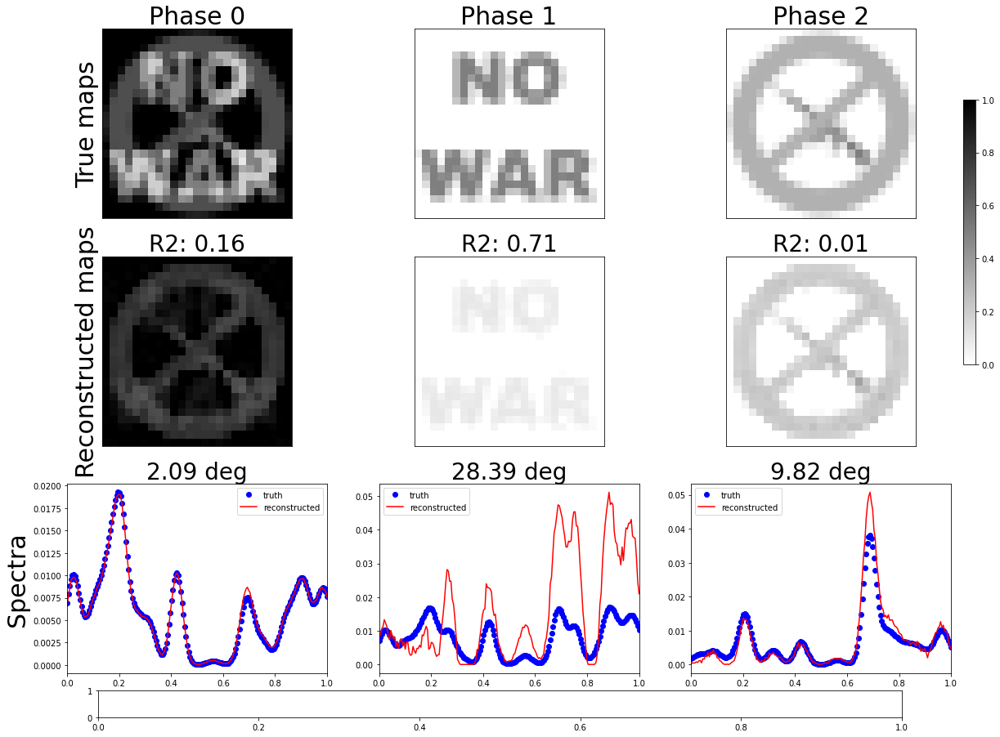

In [227]:
pixels_side = 100
num_iterations = 100
# Baseline
downsampling_factors = [4]
Hflat =None
W = None
import time
from scipy import ndimage

angles_hist = []

alphas = np.arange(0,0.5,0.05)

for idx in range(len(alphas)):
    alpha = alphas[idx]
    YSmoothedMapsMix =  YVol*(1-alpha)+ YSmoothedMaps*(alpha)
    Ximg = YSmoothedMapsMix.reshape((-1, pixels_side,pixels_side))+0.000000000001

    for i in range(len(downsampling_factors)):

        start_time = time.time()
        n = downsampling_factors[i]
        X = downsample(Ximg,n)
        # X = ndimage.median_filter(X, size=(1,3,3))

        Xflat = X.reshape((X.shape[0], -1))
        est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=0, mu=0, force_simplex=False)
        D , Hs, Ws, G, losses = est.fit_transform(Xflat, update_W=True)
        Hflat = est.H_
        W = est.W_

        Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)

        angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
        angles_hist.append(sum(angle)/len(angle))

        r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)


        plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)

In [228]:
print(angles_hist)

[12.789272287920241, 12.842619866557063, 12.905056628004607, 12.95708142258036, 13.018859565075227, 13.090425298047776, 13.168696233096071, 13.26878851537282, 13.435101185481633, 13.433059116280733]


In [190]:
def runProblem(downsampling_factors, max_iter, tol, ):
    Hflat =None
    W = None

    for i in range(len(downsampling_factors)):
        start_time = time.time()
        n = downsampling_factors[i]
        X = downsample(Ximg,n)
        Xflat = X.reshape((X.shape[0], -1))
        if (i > 0):
            factor = downsampling_factors[i-1]//downsampling_factors[i]
            H = Hflat.reshape((-1, pixels_side//n//factor, pixels_side//n//factor))
            H = H.repeat(factor, axis = 1).repeat(factor, axis = 2)
            Hflat = H.reshape((-1, pixels_side*pixels_side//n//n)) +0.001
            W =  W 

        
        est = SmoothNMF( n_components = 3,tol=tol, max_iter =max_iter, G = None, lambda_L=lambdas[j], mu=mus[j], force_simplex=False)

        if i > 0:
            D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=False)

        else:
            D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=False)


        Hflat = est.H_
        W = est.W_

        # Wdot = spim.phases
        Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
        times_exp[-1].append(time.time()-start_time)

        angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
        r2 = ordered_r2(Hdotflat_down, Hflat[true_inds,:], true_inds)

        angle_max_exp[-1].append(sum(angle)/len(angle))
        r2_max_exp[-1].append(sum(r2)/len(r2))

        plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)
    return 

In [125]:
def downsample(X,n):
    b = X.shape[2]//n
    return X.reshape(X.shape[0], -1, n, b, n).sum((-1, -3)) /(n*n)

def downsample_flat(X,n, pixels_side):
    X = X.reshape((-1, pixels_side,pixels_side))
    X = downsample(X,n)
    return X.reshape((-1, pixels_side*pixels_side//n//n))

def checkerboard(X):
    n = X.shape[2]
    if n % 2 != 0:
        raise ValueError("n must be even")
    evens = np.array([i*2 for i in range(n//2)])
    odds = np.array([i*2+1 for i in range(n//2)])
    X_1 = X[:,evens][:,:,evens]
    X_2 = X[:,evens]
    X_2 = X_2[:,:,odds]
    X_3 = X[:,odds]
    X_3 = X_3[:,:,evens]
    X_4 = X[:,odds]
    X_4 = X_4[:,:,odds]
    return X_1, X_2, X_3, X_4

def NNL(D,H,Y):
    return np.sum(-Y*np.log(D@H+0.0000001) + D@H)

(200, 50, 50)
(200, 50, 50)


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  31.206 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 1.0 seconds.
18328.035565041297


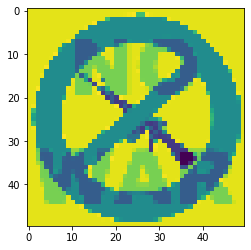

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  56.130 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36651.573525165484


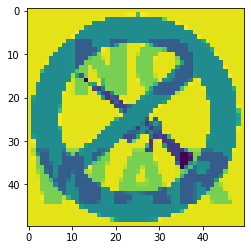

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  58.195 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.14340933024


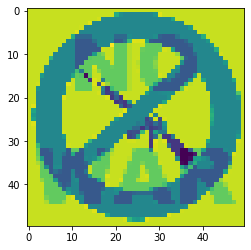

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  53.798 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.267935587563


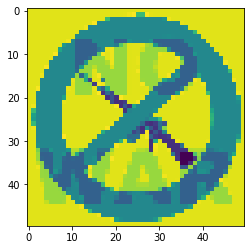

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  33.488 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36652.14116791745


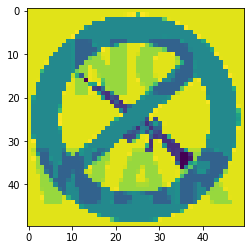

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  56.705 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.98231221813


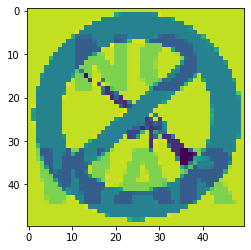

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  61.906 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.977278607843


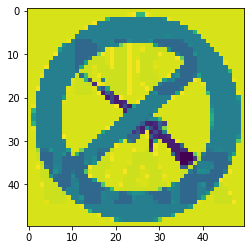

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  59.975 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36653.61933042286


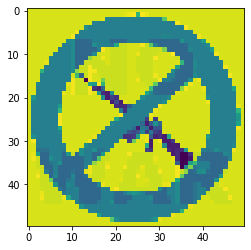

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  33.390 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54979.18096443327


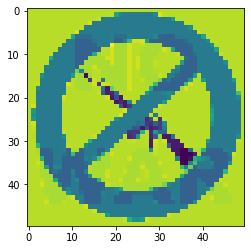

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  63.514 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.037176551108


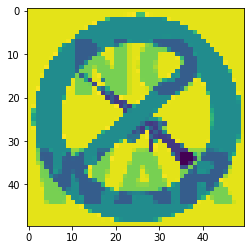

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  62.140 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36651.575270727684


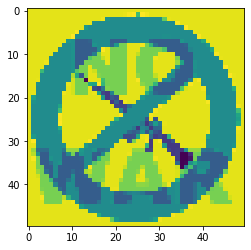

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  60.674 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.14900803477


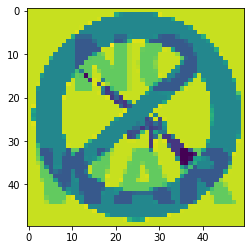

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  34.242 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.265876964902


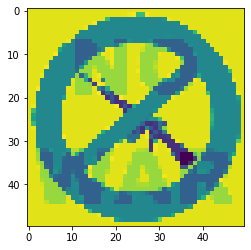

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  63.723 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36652.13565135539


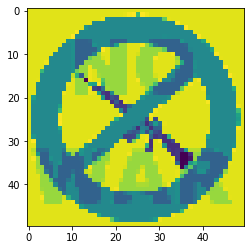

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  59.033 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.975451568636


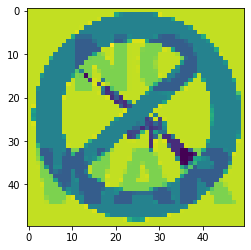

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  61.180 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.977090551518


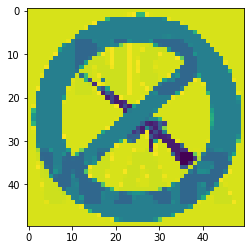

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  34.358 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36653.619564540626


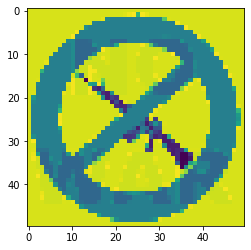

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  62.455 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54979.181656047345


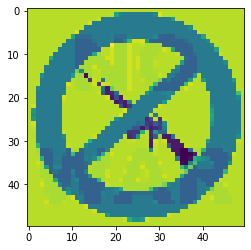

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  63.171 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.056447854353


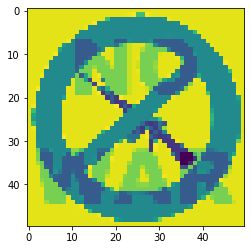

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  62.849 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36651.60539918521


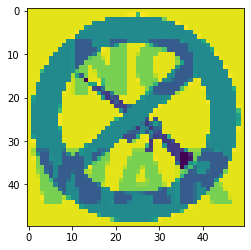

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  34.214 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.21496767247


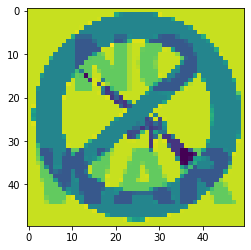

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  61.989 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.252457702325


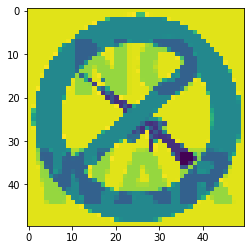

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  64.649 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36652.0977870825


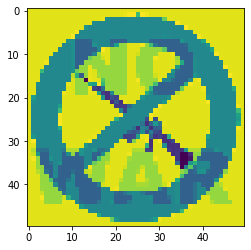

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.000,  58.713 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54976.93082202948


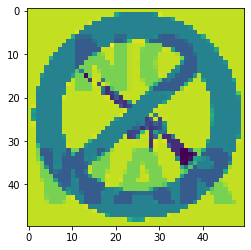

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  32.585 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
18328.97718215893


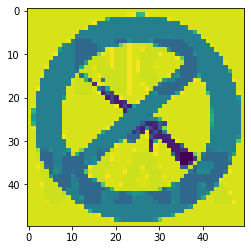

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  60.045 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
36653.62527882078


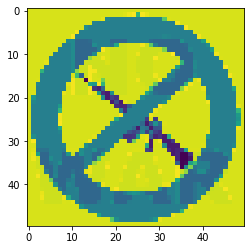

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 20: loss 0.001,  59.634 it/s
exits because max_iteration was reached
Stopped after 20 iterations in 0.0 minutes and 0.0 seconds.
54979.19297724721


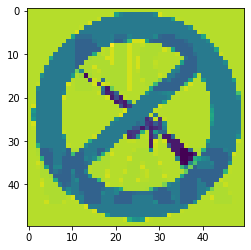

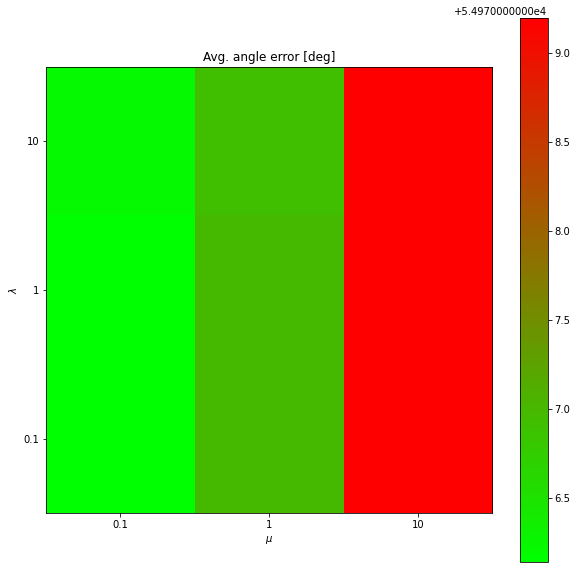

fsdfs
0.1 0.1
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


exits because of relative change < tol: -6.938783646356755e-05
exits because of relative change < tol: -4.586951317504339e-05
exits because of relative change < tol: -3.243867544322934e-05
exits because of relative change < tol: -2.424815729340961e-05
exits because of relative change < tol: -1.8999974424622787e-05
exits because of relative change < tol: -1.542755706429902e-05
exits because of relative change < tol: -1.285093784680433e-05
exits because of relative change < tol: -1.0900954422318122e-05
exits because of relative change < tol: -9.36963834154415e-06
It 10 / 200: loss -0.439,  12.671 it/s
exits because of relative change < tol: -8.133851754978182e-06
exits because of relative change < tol: -7.116615604238084e-06
exits because of relative change < tol: -6.2670465512396505e-06
exits because of relative change < tol: -5.549656345753796e-06
exits because of relative change < tol: -4.938506329476592e-06
exits because of relative change < tol: -4.413944667153222e-06
exits because 

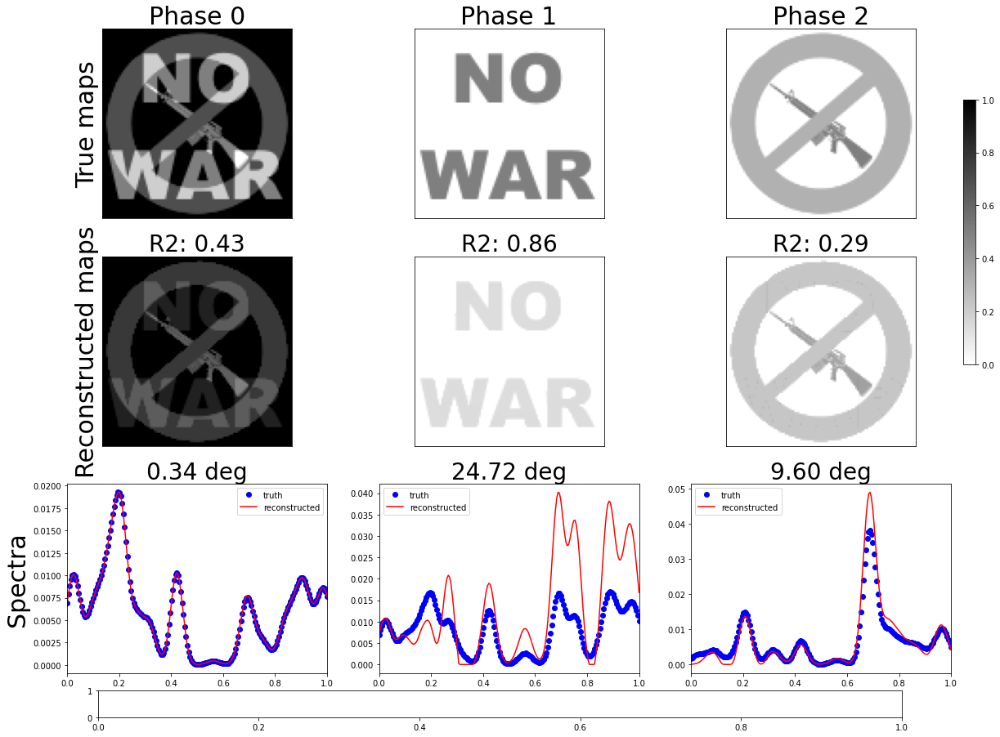

In [71]:


angle_max_exp = []
r2_max_exp = []
kl_max_exp = []
times_exp = []
import time
from scipy import ndimage

pixels_side = 100
Ximg = YdotVol.reshape((-1, pixels_side,pixels_side))
num_iterations = 20




# Baseline
downsampling_factors = [1]
Hflat =None
W = None
start_time = time.time()
n = downsampling_factors[0]
X = downsample(Ximg,n)
XsCheckerboard = checkerboard(X)
print(XsCheckerboard[0].shape)
print(XsCheckerboard[1].shape)

Xflats= [XsCheckerboard[i].reshape((XsCheckerboard[i].shape[0], -1)) for i in range(4)]
    

loss_regs = []

n = 3
m = 3
lambdas = [10**((i//n)-1) for i in range(n*m)]
mus = [10**((i%n)-1) for i in range(n*m)]
for j in range(len(mus)):

    # For every 
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=lambdas[j], mu=mus[j], force_simplex=False)
    Hs_reg = []
    Ds_reg = []
    Ws_reg = []
    loss_reg = 0
    for i in range(3):
        D , Hs, Ws, G, losses = est.fit_transform(Xflats[i], W=None, H=None, update_W=True)
        Hflat = est.H_
        W = est.W_
        loss_reg += NNL(D,Hflat,Xflats[3])
        print(loss_reg)

        times_exp.append(time.time()-start_time)

        angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
        plt.imshow(Hflat[true_inds[0]].reshape(50,50))
        plt.show()
        # r2 = ordered_r2(Hdotflat, Hflat, true_inds)

        # angle_max_exp.append(sum(angle)/len(angle))
        # r2_max_exp.append(sum(r2)/len(r2))
        # kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))

        # plot_results(Ddot, D, Hdotflat, Hflat, pixels_side//n, Hs, Ws, G, losses)
    loss_regs.append(loss_reg)


n = 3
m = 3
labels = ["$\mu$ ="+str(mus[i])+"$\lambda$ ="+str(lambdas[i]) for i in range(n*m)]

from matplotlib.colors import LinearSegmentedColormap

cmap_red_green = LinearSegmentedColormap.from_list("gradients", [(1,0,0),(0,1,0)], N=100)
cmap_green_red = LinearSegmentedColormap.from_list("gradients", [(0,1,0),(1,0,0)], N=100)


Z = [loss_regs[i] for i in range(n*m)]
Z = np.array(Z)
Z = np.reshape(Z, (n,m))

plt.show()
fig = plt.figure(figsize = (10,10))
plt.imshow(Z, cmap=cmap_green_red,origin='lower')
plt.yticks([i for i in range(n)], [str(10**((i)-1)) for i in range(n)])
plt.xticks([i for i in range(m)], [str(10**((i)-1)) for i in range(m)])
plt.ylabel("$\lambda$")
plt.xlabel("$\mu$")
cbar = plt.colorbar()
plt.title("Avg. angle error [deg]")
# plt.draw()
plt.show()
print("fsdfs")


# Find index of lowest loss_reg
min_loss_reg = np.argmin(loss_reg)
num_iterations = 200



print(lambdas[min_loss_reg], mus[min_loss_reg])
est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=lambdas[min_loss_reg], mu=mus[min_loss_reg], force_simplex=False)

D , Hs, Ws, G, losses = est.fit_transform_checkerboard(Xflats, update_W=True)
Hflat = est.H_
W = est.W_

times_exp.append(time.time()-start_time)

angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
r2 = ordered_r2(Hdotflat, Hflat, true_inds)

angle_max_exp.append(sum(angle)/len(angle))
r2_max_exp.append(sum(r2)/len(r2))
kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))
print(Hflat.shape)
plot_results(Ddot, D, Hdotflat, Hflat, pixels_side, Hs, Ws, G, losses)






In [72]:
print(spim.maps.shape)

AttributeError: 'Signal2D' object has no attribute 'maps'

[55033.105063879615, 55032.85484974536, 55034.204687257065, 55033.04137351257, 55032.874865636986, 55034.21522338161, 55033.109986457814, 55032.86036537781, 55034.13828343479]
(200, 50, 50)


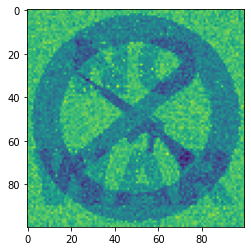

In [65]:
print(loss_regs)
plt.imshow(est.H_[0].reshape(100,100))

print(X[:,::2,1::2].shape)

# Solve the problem

3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  21.135 it/s
It 20 / 100: loss 0.002,  22.278 it/s
exits because of relative change < tol: 0.00010807557705382135
exits because of relative change < tol: 0.00010193291705051613
exits because of relative change < tol: 9.623211566509661e-05
It 30 / 100: loss 0.002,  22.764 it/s
exits because of relative change < tol: 9.089235578925301e-05
exits because of relative change < tol: 8.584885042841883e-05
exits because of relative change < tol: 8.105169338952395e-05
exits because of relative change < tol: 7.646445210445724e-05
exits because of relative change < tol: 7.206252556306354e-05
exits because of relative change < tol: 6.783125496675025e-05
exits because of relative change < tol: 6.376380068189109e-05
exits because of relative change < tol: 5.985887610320645e-05
exits because of relative change < tol: 5.611851456010771e-05
exits because of relative change < tol: 5.254608610378925e-05
It 40 / 100: loss 0.002,  23.076 it/s
exits because of relative change < tol: 

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  11.043 it/s
It 20 / 100: loss 0.002,  13.007 it/s
It 30 / 100: loss 0.002,  13.965 it/s
It 40 / 100: loss 0.002,  14.108 it/s
It 50 / 100: loss 0.002,  14.514 it/s
It 60 / 100: loss 0.002,  14.779 it/s
It 70 / 100: loss 0.002,  14.734 it/s
It 80 / 100: loss 0.002,  14.919 it/s
It 90 / 100: loss 0.002,  15.073 it/s
exits because max_iteration was reached
Stopped after 100 iterations in 0.0 minutes and 7.0 seconds.
[[1.03050837e+00 9.34333760e-01 1.03119725e+00 ... 1.11961366e+00
  1.03301267e+00 9.77033710e-01]
 [1.00000000e-04 1.00000000e-04 1.00000000e-04 ... 1.00000000e-04
  1.00000000e-04 1.00000000e-04]
 [1.00000000e-04 1.00000000e-04 1.00000000e-04 ... 1.00000000e-04
  1.00000000e-04 1.00000000e-04]]
[[1.03050837e+00 9.34333760e-01 1.03119725e+00 ... 1.11961366e+00
  1.03301267e+00 9.77033710e-01]
 [1.00000000e-04 1.00000000e-04 1.00000000e-04 ... 1.00000000e-04
  1.00000000e-04 1.00000000e-04]
 [1.00000000e-04 1.00000000e-04 1.00000000e-04 ... 1.00000000

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 40 / 100: loss 0.000,  206.268 it/s
It 50 / 100: loss 0.000,  206.012 it/s
exits because of relative change < tol: 0.00020379603272333645
exits because of relative change < tol: 0.0001883828307736564
exits because of relative change < tol: 0.00017432784356508104
exits because of relative change < tol: 0.0001615242210635976
exits because of relative change < tol: 0.0001498689931463724
exits because of relative change < tol: 0.00013926370854322104
exits because of relative change < tol: 0.0001296150509068364
It 60 / 100: loss 0.000,  207.928 it/s
exits because of relative change < tol: 0.00012083535131700534
exits because of relative change < tol: 0.00011284294767229399
exits because of relative change < tol: 0.0001055623775911317
exits because of relative change < tol: 9.89244077823648e-05
exits because of relative change < tol: 9.286592217432051e-05
exits because of relative change < tol: 8.732969249672147e-05
exits because of relative change < tol: 8.22640658865324e-05
exits becaus

/Users/maxmartinezruts/Documents/GitHub/esmpy/esmpy/measures.py:227: RuntimeWarning: invalid value encountered in log
  return np.sum(true_maps * np.log(true_maps / (algo_maps+ 0.000001) +0.000001))/p
/Users/maxmartinezruts/Documents/GitHub/esmpy/esmpy/measures.py:227: RuntimeWarning: invalid value encountered in log
  return np.sum(true_maps * np.log(true_maps / (algo_maps+ 0.000001) +0.000001))/p


3
It 10 / 100: loss 0.016,  20.312 it/s
It 20 / 100: loss 0.014,  21.018 it/s
It 30 / 100: loss 0.014,  21.228 it/s
exits because of relative change < tol: 0.0003247532598459466
exits because of relative change < tol: 0.00023436798092109218
exits because of relative change < tol: 0.00016879806269252517
exits because of relative change < tol: 0.00012147614334125456
exits because of relative change < tol: 8.748385667600532e-05
exits because of relative change < tol: 6.31629767024546e-05
exits because of relative change < tol: 4.5828158728825835e-05
exits because of relative change < tol: 3.3444212914234034e-05
It 40 / 100: loss 0.014,  21.281 it/s
exits because of relative change < tol: 2.4667281359784158e-05
exits because of relative change < tol: 1.850387871286193e-05
exits because of relative change < tol: 1.4152393413423225e-05
exits because of relative change < tol: 1.1055621460288925e-05
exits because of relative change < tol: 8.826186692966418e-06
exits because of relative change 

/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.000,  21.683 it/s
It 20 / 100: loss 0.000,  22.711 it/s
It 30 / 100: loss 0.000,  23.134 it/s
It 40 / 100: loss 0.000,  22.970 it/s
exits because of relative change < tol: 0.00012752638184090686
exits because of relative change < tol: 0.00011726939467839708
exits because of relative change < tol: 0.0001079728235116972
exits because of relative change < tol: 9.95241497420972e-05
exits because of relative change < tol: 9.182702933627724e-05
exits because of relative change < tol: 8.479953084953227e-05
exits because of relative change < tol: 7.837222524105374e-05
exits because of relative change < tol: 7.248627614355653e-05
exits because of relative change < tol: 6.709163039415869e-05
exits because of relative change < tol: 6.214537634666681e-05
It 50 / 100: loss 0.000,  23.062 it/s
exits because of relative change < tol: 5.7610304324820626e-05
exits because of relative change < tol: 5.3453688954483136e-05
exits because of relative change < tol: 4.9646295377994625e-05


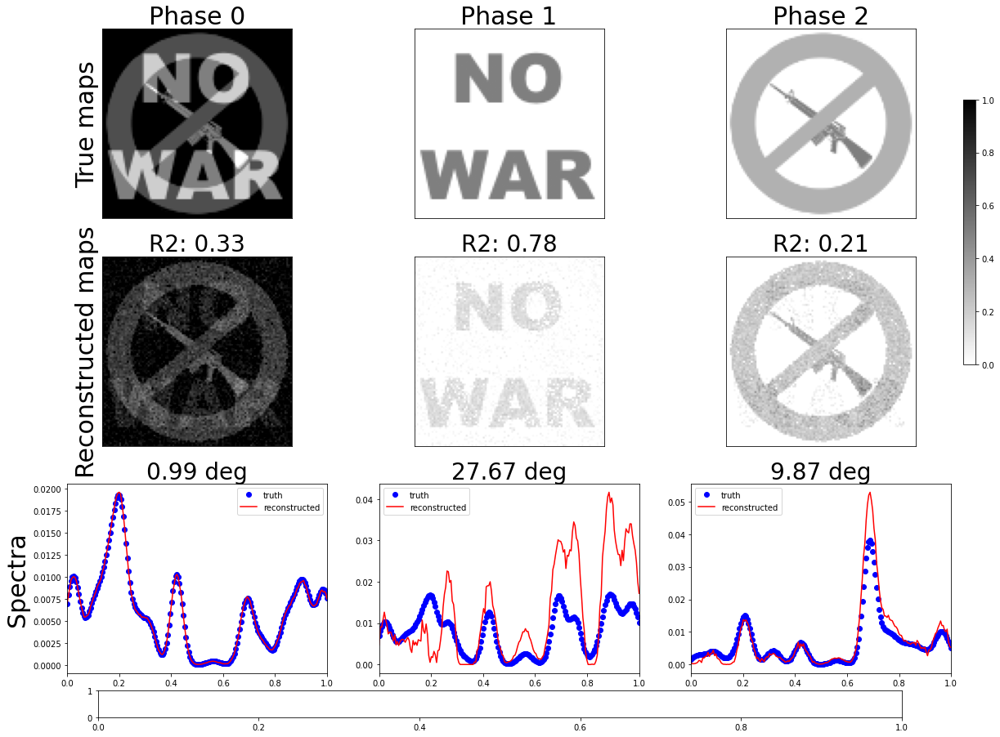

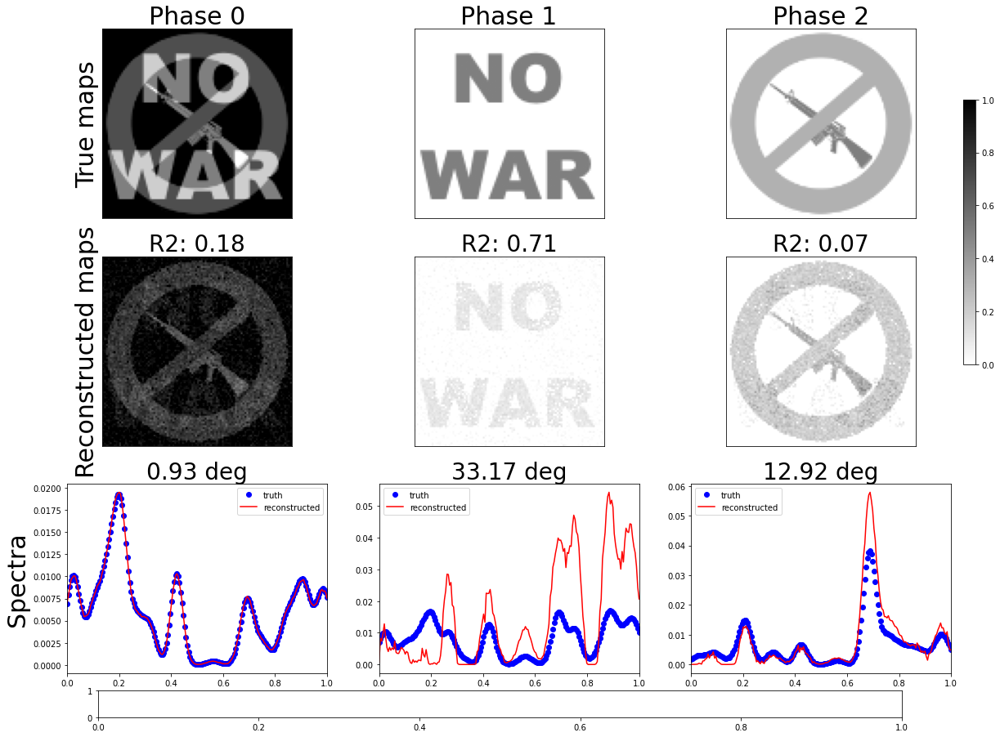

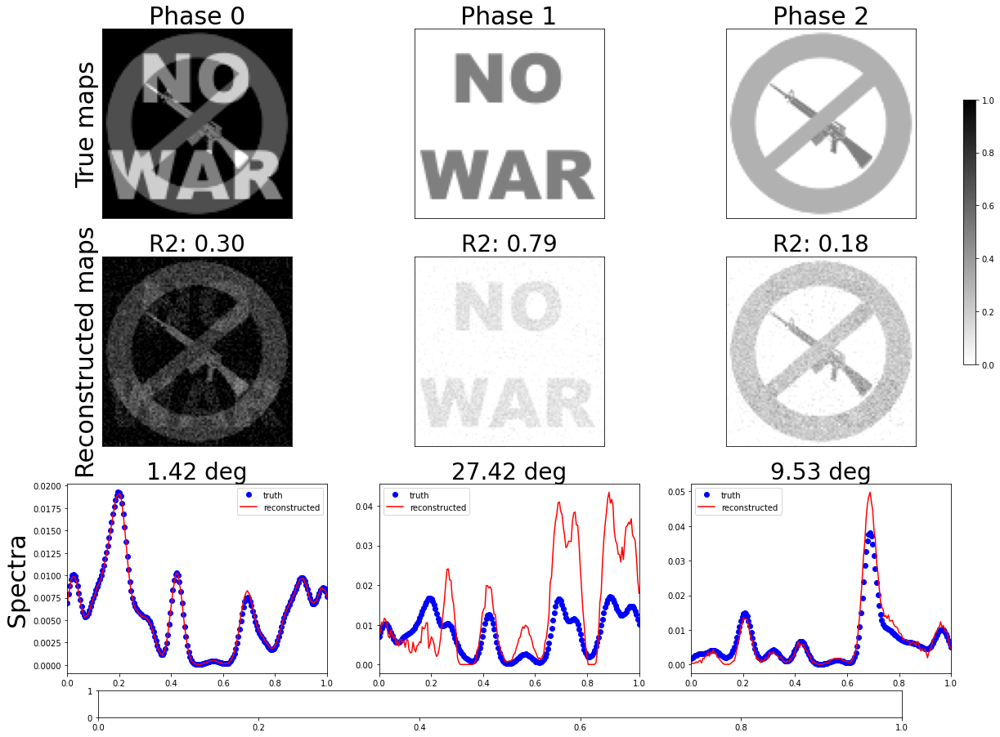

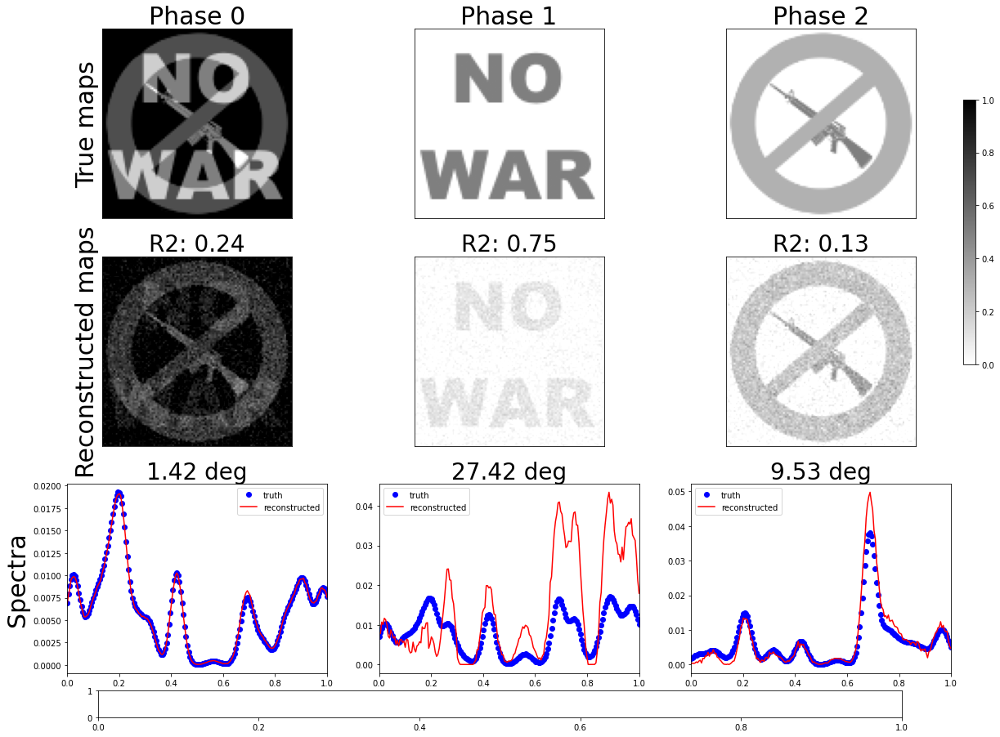

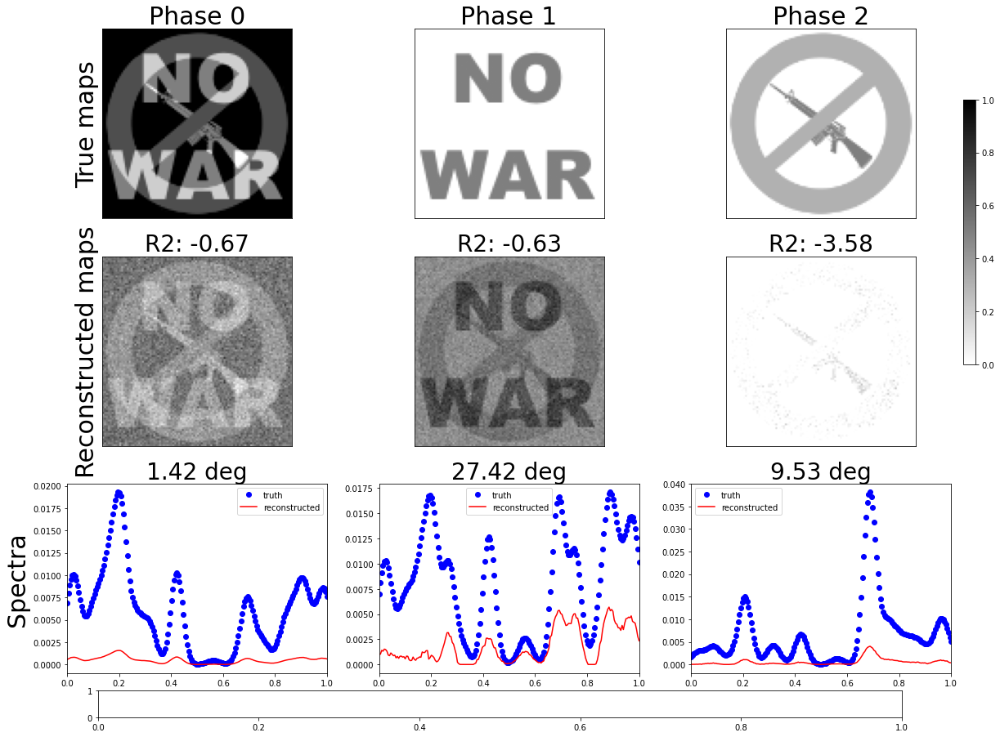

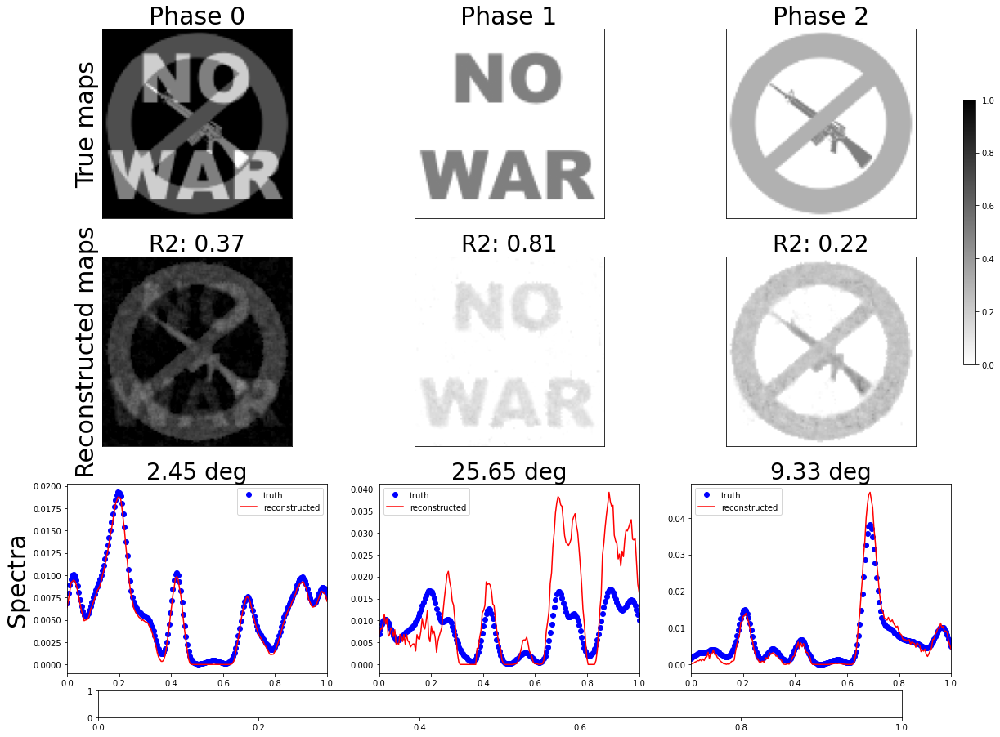

In [26]:
angle_max_exp = []
r2_max_exp = []
kl_max_exp = []
times_exp = []
import time
from scipy import ndimage

pixels_side = 100
Ximg = Y.reshape((-1, pixels_side,pixels_side))
num_iterations = 100




# Baseline
downsampling_factors = [1]
Hflat =None
W = None

for i in range(len(downsampling_factors)):
    start_time = time.time()
    n = downsampling_factors[i]
    X = downsample(Ximg,n)
    Xflat = X.reshape((X.shape[0], -1))
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=0, mu=0, force_simplex=False)
    D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=True)
    Hflat = est.H_
    W = est.W_

    times_exp.append(time.time()-start_time)

    angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
    r2 = ordered_r2(Hdotflat, Hflat, true_inds)

    angle_max_exp.append(sum(angle)/len(angle))
    r2_max_exp.append(sum(r2)/len(r2))
    kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))

    plot_results(Ddot, D, Hdotflat, Hflat, pixels_side//n, Hs, Ws, G, losses)

downsampling_factors = [1]
Hflat =None
W = None

# Baseline with regularization
for i in range(len(downsampling_factors)):
    start_time = time.time()
    n = downsampling_factors[i]
    X = downsample(Ximg,n)
    Xflat = X.reshape((X.shape[0], -1))
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=10, mu=10, force_simplex=False)
    D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=True)
    Hflat = est.H_
    W = est.W_

    # Wdot = spim.phases
    Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
    times_exp.append(time.time()-start_time)

    angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
    r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

    angle_max_exp.append(sum(angle)/len(angle))
    r2_max_exp.append(sum(r2)/len(r2))
    kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))

    plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)



# Downsample 
downsampling_factors = [4,1]
Hflat =None
W = None

for i in range(len(downsampling_factors)):
    start_time = time.time()
    n = downsampling_factors[i]
    X = downsample(Ximg,n)
    Xflat = X.reshape((X.shape[0], -1))
    if (i > 0):
        factor = downsampling_factors[i-1]//downsampling_factors[i]
        H = Hflat.reshape((-1, pixels_side//n//factor, pixels_side//n//factor))
        H = H.repeat(factor, axis = 1).repeat(factor, axis = 2)
        Hflat = H.reshape((-1, pixels_side*pixels_side//n//n)) +0.001
        W =  W 

    
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=0, mu=0, force_simplex=False)

    if i > 0:
        D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=False)

    else:
        D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=True)


    Hflat = est.H_
    W = est.W_

    if (i == 0):
        intermediateW = W.copy()
        intermediateTime = time.time()-start_time

    # Wdot = spim.phases
    Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
times_exp.append(time.time()-start_time)

angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

angle_max_exp.append(sum(angle)/len(angle))
r2_max_exp.append(sum(r2)/len(r2))
kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))


plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)


start_time = time.time()
# Downsample with regularization
Hflat = np.linalg.pinv(intermediateW)@Xflat
Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
times_exp.append(time.time()-start_time + intermediateTime)

angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

angle_max_exp.append(sum(angle)/len(angle))
r2_max_exp.append(sum(r2)/len(r2))
kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))
plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)

downsampling_factors = [1]
W = intermediateW
Hflat = None
# Downsampling with regularization
for i in range(len(downsampling_factors)):
    start_time = time.time()
    n = downsampling_factors[i]
    X = downsample(Ximg,n)
    Xflat = X.reshape((X.shape[0], -1))
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=10, mu=10, force_simplex=False)
    D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W , H=Hflat, update_W=False)
    Hflat = est.H_
    W = est.W_

    # Wdot = spim.phases
    Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
    times_exp.append(time.time()-start_time)

    angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
    r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

    angle_max_exp.append(sum(angle)/len(angle))
    r2_max_exp.append(sum(r2)/len(r2))
    kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))

    plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)


downsampling_factors = [1]
Hflat =None
W = None

# Median Filter
for i in range(len(downsampling_factors)):
    start_time = time.time()
    n = downsampling_factors[i]
    X = downsample(Ximg,n)
    X = ndimage.median_filter(X, size=(1,3,3))
    Xflat = X.reshape((X.shape[0], -1))
    est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = num_iterations, G = None, lambda_L=0, mu=0, force_simplex=False)
    D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=True)
    Hflat = est.H_
    W = est.W_

    # Wdot = spim.phases
    Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
    times_exp.append(time.time()-start_time)

    angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
    r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

    angle_max_exp.append(sum(angle)/len(angle))
    r2_max_exp.append(sum(r2)/len(r2))
    kl_max_exp.append(ordered_kl(Hdotflat, Hflat, true_inds))

    plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)



# plt.scatter(r2_max_exp, angle_max_exp)
# plt.title("Avg R2 and Angle error (all experiments)")
# plt.xlabel("Avg R2 error [-]")
# plt.ylabel("Avg angle error [deg]")
# plt.xlim(1, min(r2_max_exp))  
# plt.ylim(0, max(angle_max_exp)) 

# annotations = ['baseline', 'regulatization ($\lambda$ = 10, $\mu$ = 10)', 'smoothing median filter of size (1,10,10)', 'downsampling (16->8->4->2->1)', 'Intermediate smoothing']

# # Add annotations to each data point
# for i in range(len(r2_max_exp)):
#     plt.annotate(annotations[i], xy=(r2_max_exp[i], angle_max_exp[i]), ha='center')


# plt.grid()
# plt.show()




[8.85182809829712, 8.96083116531372, 13.431919813156128, 4.97885799407959, 0.9459829330444336, 10.13037371635437, 8.68415379524231]


ValueError: x and y must have same first dimension, but have shapes (1,) and (6,)

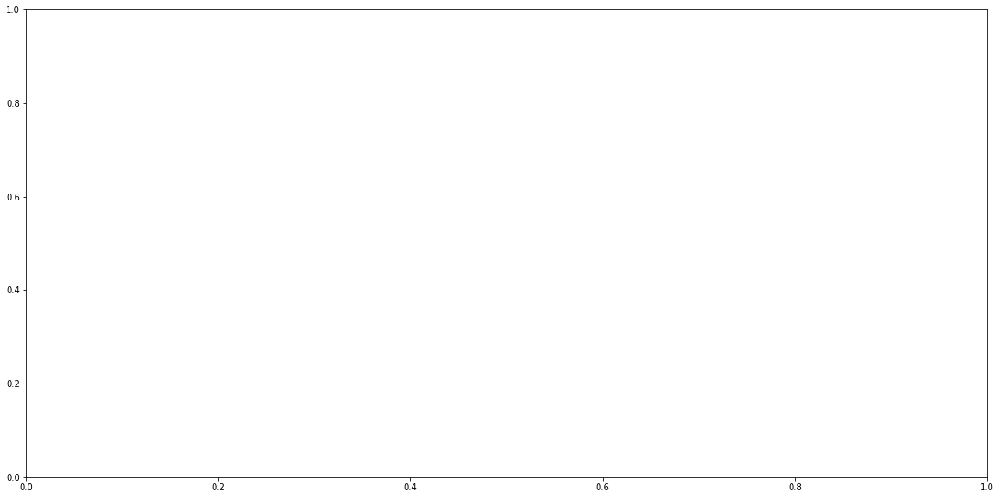

In [19]:
print(times_exp)
fig = plt.figure(figsize = (20,10))

plt.plot(dfs, [times_exp[i]/1000 for i in range(6)])
plt.plot(dfs, [times_exp[5]/1000*(dfs[5]/dfs[i])*(dfs[5]/dfs[i]) for i in range(6)])
plt.plot(dfs, [times_exp[5]/1000*(dfs[5]/dfs[i]) for i in range(6)])

# plt.xlim(max(dfs), 0)  # decreasing time
plt.xticks(dfs)
plt.title('Computation time/iteration vs downsampling factor')
plt.ylabel('Avg. time/iteration [s]')
plt.xlabel('Downsampling factor [-]')

plt.yscale('log',base=10) 
plt.legend(['Obtained', 'Quadratic Relation', 'Linear Relation'])
plt.grid()
plt.show()

[4.436645030975342, 6.7286460399627686, 2.532628059387207, 0.5054931640625, 5.003535985946655, 4.5930280685424805]


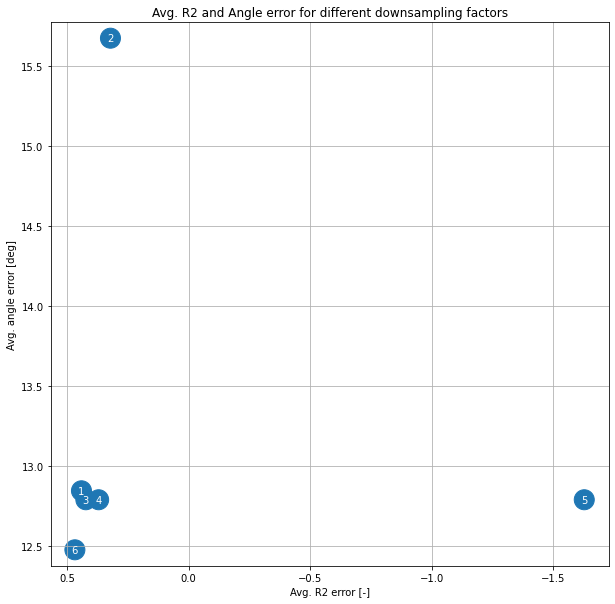

[4.436645030975342, 6.7286460399627686, 2.532628059387207, 0.5054931640625, 5.003535985946655, 4.5930280685424805]


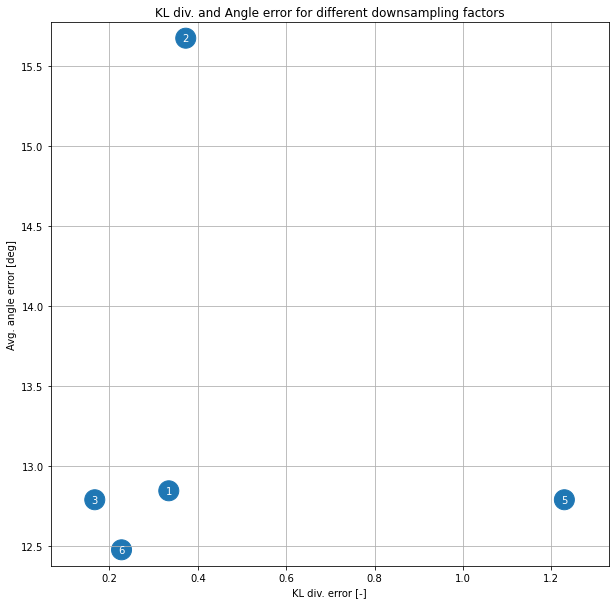

300
[0.3344562562237691, 0.3728307080104906, 0.16701428116474312, nan, 1.2294502021686369, 0.22755074310018417]
[0.3344562562237691, 0.3728307080104906, 0.16701428116474312, nan, 1.2294502021686369, 0.22755074310018417]


In [27]:

fig = plt.figure(figsize = (10,10))

plt.scatter(r2_max_exp, angle_max_exp, [400 for i in range(len(times_exp))])
plt.title("Avg. R2 and Angle error for different downsampling factors")
plt.xlabel("Avg. R2 error [-]")
plt.ylabel("Avg. angle error [deg]")
plt.xlim(max(r2_max_exp)+0.1, min(r2_max_exp)-0.1)  
plt.ylim(min(angle_max_exp)-0.1, max(angle_max_exp)+0.1) 

annotations = ['1','2','3','4','5','6','7','8']

# Add annotations to each data point
for i in range(len(r2_max_exp)):
    plt.annotate(annotations[i], xy=(r2_max_exp[i], angle_max_exp[i]), va='center',ha='center', color='white')

print(times_exp)
plt.grid()
plt.show()


fig = plt.figure(figsize = (10,10))


plt.scatter(kl_max_exp, angle_max_exp, [400 for i in range(len(times_exp))])
plt.title("KL div. and Angle error for different downsampling factors")
plt.xlabel("KL div. error [-]")
plt.ylabel("Avg. angle error [deg]")
plt.xlim(min(kl_max_exp)-0.1, max(kl_max_exp)+0.1)  
plt.ylim(min(angle_max_exp)-0.1, max(angle_max_exp)+0.1) 

annotations = ['1','2','3','4','5','6','7','8']

# Add annotations to each data point
for i in range(len(r2_max_exp)):
    plt.annotate(annotations[i], xy=(kl_max_exp[i], angle_max_exp[i]), va='center',ha='center', color='white')

print(times_exp)
plt.grid()
plt.show()
print(n_poisson)
print(kl_max_exp)
print(kl_max_exp)


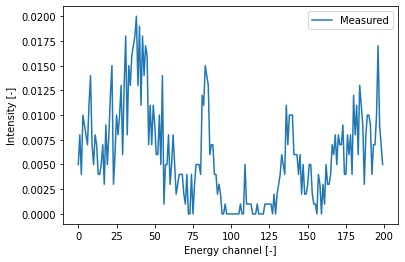

In [212]:
angle_max_exp = []
r2_max_exp = []
times_exp = []

pixels_side = 100
Ximg = Y.reshape((-1, pixels_side,pixels_side))
num_iterations = 200


X = downsample(Ximg,1)
# Xdot_ = downsample(XimgDot, 10)
plt.plot(X[:,0,0])
# plt.plot(Xdot_[:,0,0])
plt.xlabel('Energy channel [-]')
plt.ylabel('Intensity [-]')
plt.legend(['Measured', 'Ground Truth'])
# plt.savefig("../results/df10_spectral.png",bbox_inches='tight')
plt.show()

3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  11.685 it/s
It 20 / 100: loss 0.002,  13.051 it/s
exits because of relative change < tol: 0.00010274829618930273
exits because of relative change < tol: 9.689283455517722e-05
It 30 / 100: loss 0.002,  13.621 it/s
exits because of relative change < tol: 9.137036335590842e-05
exits because of relative change < tol: 8.612528186622446e-05
exits because of relative change < tol: 8.111888950858104e-05
exits because of relative change < tol: 7.632679414687137e-05
exits because of relative change < tol: 7.173595288358805e-05
exits because of relative change < tol: 6.734152870603152e-05
exits because of relative change < tol: 6.314378317127287e-05
exits because of relative change < tol: 5.914525268537886e-05
exits because of relative change < tol: 5.5348449156686426e-05
exits because of relative change < tol: 5.1754260820707235e-05
It 40 / 100: loss 0.002,  13.895 it/s
exits because of relative change < tol: 4.836112057379109e-05
exits because of relative change < tol:

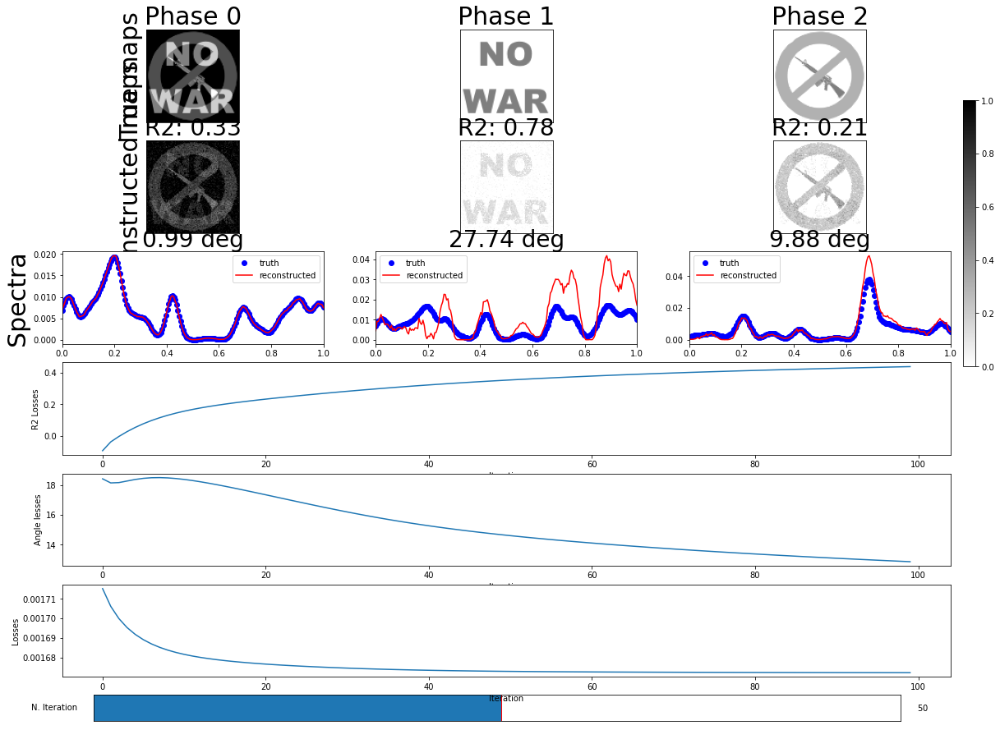

angles :  [0.9894785839635516, 9.875466230634176, 27.73801967678361]
mse :  [0.04919642668176973, 0.005249104176837972, 0.034432268887871785]
mae :  [0.1515124961674132, 0.04467414281775658, 0.09797745728133066]
r2 :  [0.33083507612400986, 0.7836962596846606, 0.20525036848040357]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.364 it/s
It 20 / 100: loss 0.002,  16.275 it/s
exits because of relative change < tol: 0.00010300391436271509
exits because of relative change < tol: 9.690272443827682e-05
It 30 / 100: loss 0.002,  15.859 it/s
exits because of relative change < tol: 9.113524684972248e-05
exits because of relative change < tol: 8.565860145507503e-05
exits because of relative change < tol: 8.044574327312854e-05
exits because of relative change < tol: 7.548163120411475e-05
exits because of relative change < tol: 7.075929569297984e-05
exits because of relative change < tol: 6.627620104149908e-05
exits because of relative change < tol: 6.203121742613827e-05
exits because of relative change < tol: 5.8022410647680405e-05
exits because of relative change < tol: 5.4245728082454014e-05
exits because of relative change < tol: 5.069453147236253e-05
It 40 / 100: loss 0.002,  15.578 it/s
exits because of relative change < tol: 4.7359819521948253e-05
exits because of relative change < tol

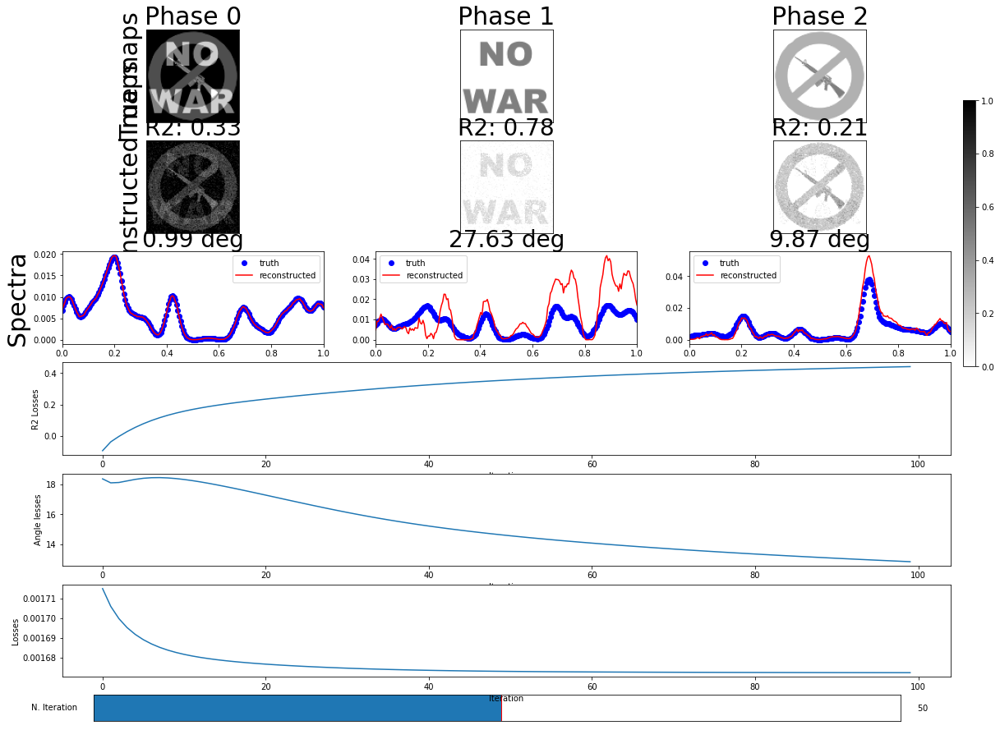

angles :  [0.9946812243314666, 9.867407058709015, 27.63486709234736]
mse :  [0.04903852166033074, 0.005240407230139626, 0.0343192258204974]
mae :  [0.15137709930759877, 0.044628147363182206, 0.09784968100480694]
r2 :  [0.332982884588522, 0.7840546412364073, 0.2078595760360894]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.264 it/s
It 20 / 100: loss 0.002,  14.647 it/s
exits because of relative change < tol: 0.0001026986356142746
exits because of relative change < tol: 9.693835188049349e-05
It 30 / 100: loss 0.002,  14.797 it/s
exits because of relative change < tol: 9.151616334283943e-05
exits because of relative change < tol: 8.637486195326688e-05
exits because of relative change < tol: 8.14720461449371e-05
exits because of relative change < tol: 7.677818377995709e-05
exits because of relative change < tol: 7.227457834081479e-05
exits because of relative change < tol: 6.795119620055682e-05
exits because of relative change < tol: 6.380437061408894e-05
exits because of relative change < tol: 5.9834493510253574e-05
exits because of relative change < tol: 5.604388549185101e-05
exits because of relative change < tol: 5.243505239852453e-05
It 40 / 100: loss 0.002,  15.527 it/s
exits because of relative change < tol: 4.9009483080281904e-05
exits because of relative change < tol: 4

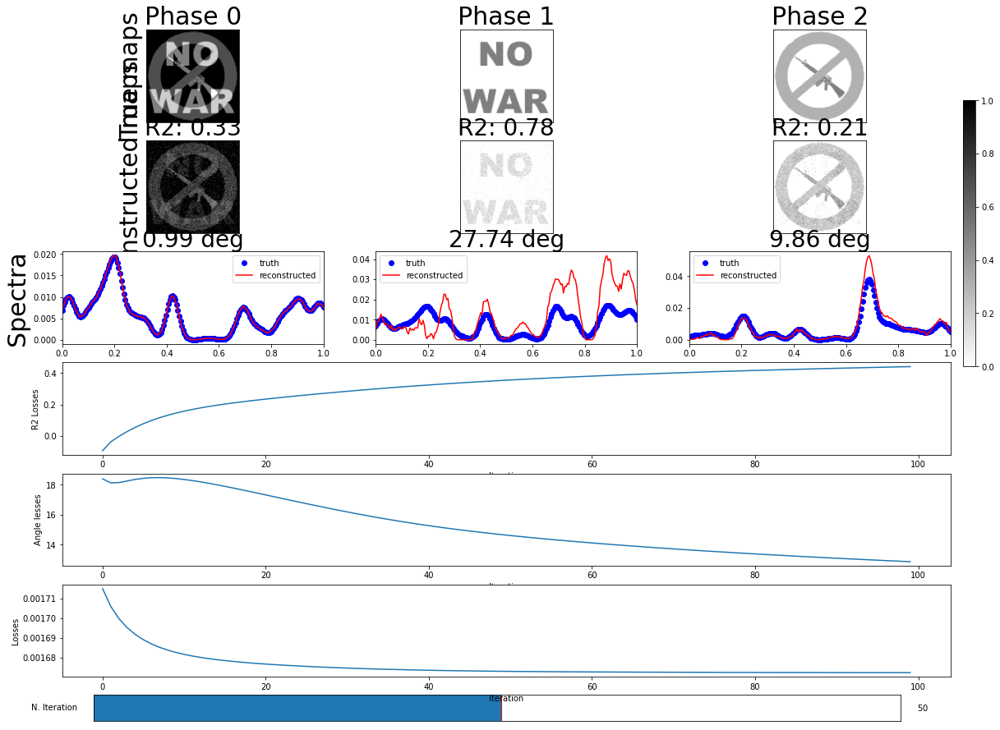

angles :  [0.989794893065603, 9.861818078974371, 27.735506943067705]
mse :  [0.04916172654803549, 0.005233643919916393, 0.034399349058401724]
mae :  [0.15156126893268987, 0.04459144647859986, 0.09793723556600337]
r2 :  [0.33130706390676, 0.7843333419916055, 0.2060102086880362]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.232 it/s
It 20 / 100: loss 0.002,  14.633 it/s
exits because of relative change < tol: 0.00010854275251198447
exits because of relative change < tol: 0.00010215912184221196
exits because of relative change < tol: 9.620179929154107e-05
It 30 / 100: loss 0.002,  14.558 it/s
exits because of relative change < tol: 9.060039788018955e-05
exits because of relative change < tol: 8.530062650578132e-05
exits because of relative change < tol: 8.026266494492175e-05
exits because of relative change < tol: 7.545926224373784e-05
exits because of relative change < tol: 7.087353812323643e-05
exits because of relative change < tol: 6.649652832534535e-05
exits because of relative change < tol: 6.2324610466484e-05
exits because of relative change < tol: 5.8357032739341685e-05
exits because of relative change < tol: 5.45937959663045e-05
exits because of relative change < tol: 5.103409857466506e-05
It 40 / 100: loss 0.002,  14.583 it/s
exits because of relative change < tol: 4.

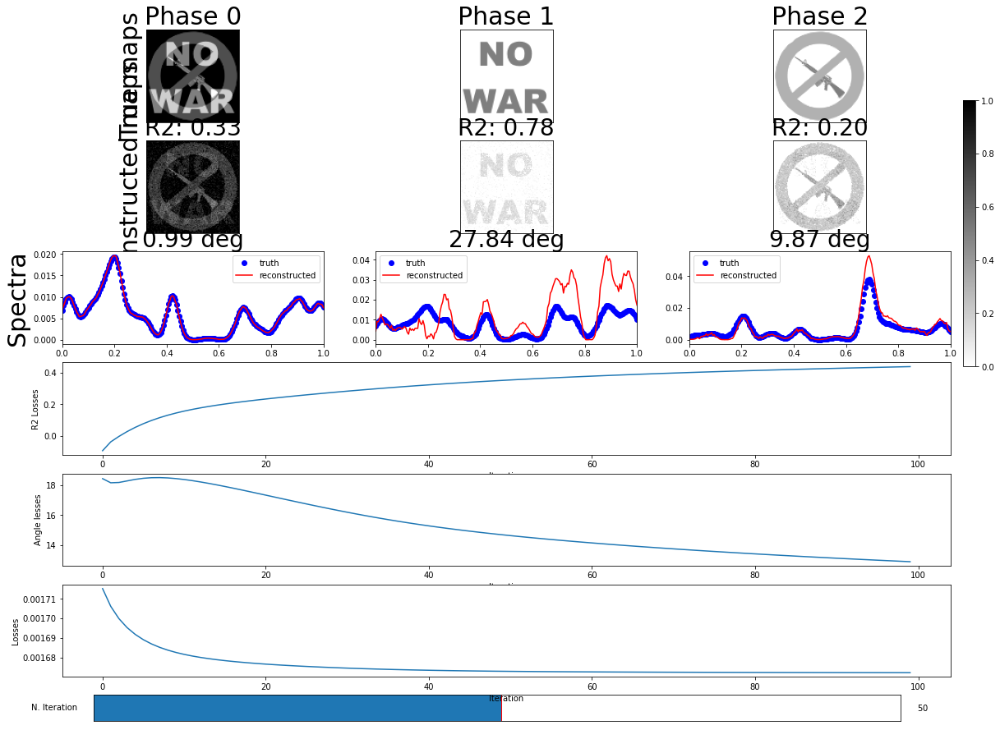

angles :  [0.9853264749632445, 9.866562062547445, 27.842333858769962]
mse :  [0.0493110303904338, 0.005236153532704513, 0.034536712092773834]
mae :  [0.15168029859957016, 0.04459148262635555, 0.09809513441098704]
r2 :  [0.3292762478277971, 0.7842299265106919, 0.20283965895437917]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.347 it/s
It 20 / 100: loss 0.002,  14.111 it/s
exits because of relative change < tol: 0.00010756942693663245
exits because of relative change < tol: 0.00010149914827164186
exits because of relative change < tol: 9.587502545428697e-05
It 30 / 100: loss 0.002,  14.428 it/s
exits because of relative change < tol: 9.06152433765992e-05
exits because of relative change < tol: 8.565369634265096e-05
exits because of relative change < tol: 8.093869567804982e-05
exits because of relative change < tol: 7.643160738701304e-05
exits because of relative change < tol: 7.210542159680532e-05
exits because of relative change < tol: 6.794317912887682e-05
exits because of relative change < tol: 6.39361796683162e-05
exits because of relative change < tol: 6.008197426846505e-05
exits because of relative change < tol: 5.6382250360744014e-05
exits because of relative change < tol: 5.28408046967969e-05
It 40 / 100: loss 0.002,  14.462 it/s
exits because of relative change < tol: 4.

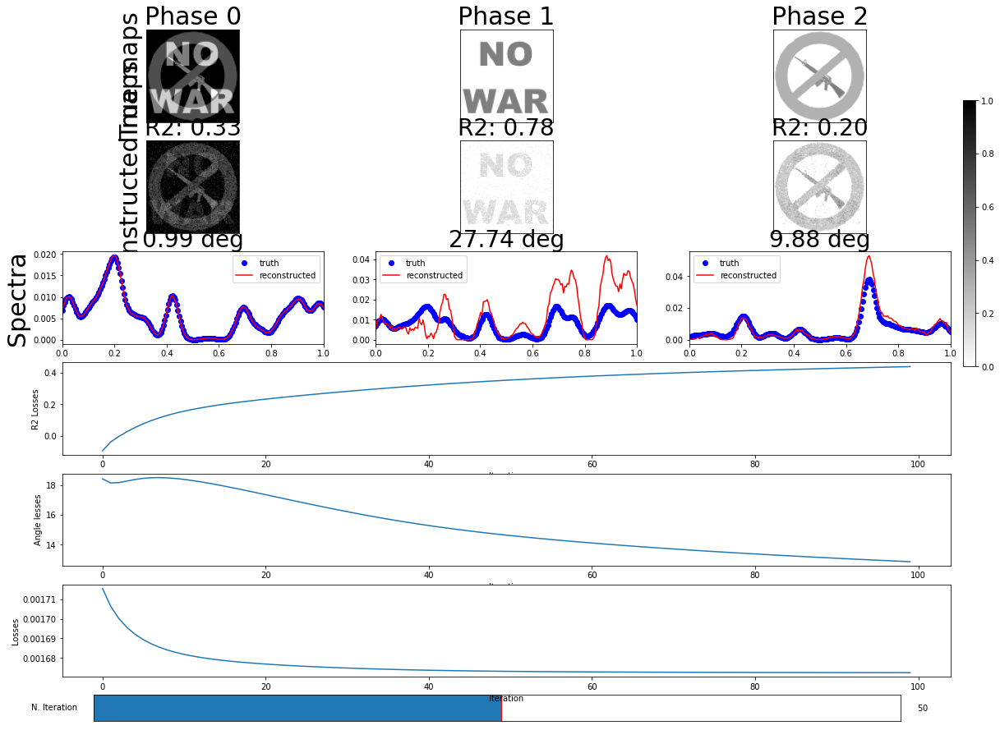

angles :  [0.988735542010114, 9.879055347334234, 27.74065712368913]
mse :  [0.049196179193246974, 0.005248911153342503, 0.034443183017874426]
mae :  [0.1515685238314411, 0.04465407155652925, 0.0979843482481237]
r2 :  [0.3308384424383879, 0.7837042137474173, 0.20499845360293223]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.261 it/s
It 20 / 100: loss 0.002,  14.715 it/s
exits because of relative change < tol: 0.00010816135695734218
exits because of relative change < tol: 0.00010202954431748119
exits because of relative change < tol: 9.633927575050015e-05
It 30 / 100: loss 0.002,  14.844 it/s
exits because of relative change < tol: 9.101067552957439e-05
exits because of relative change < tol: 8.59794677253613e-05
exits because of relative change < tol: 8.119569029370464e-05
exits because of relative change < tol: 7.66222913414388e-05
exits because of relative change < tol: 7.223361831333765e-05
exits because of relative change < tol: 6.801374705887192e-05
exits because of relative change < tol: 6.395461022778622e-05
exits because of relative change < tol: 6.00539570507228e-05
exits because of relative change < tol: 5.631327314637728e-05
exits because of relative change < tol: 5.2735852783325525e-05
It 40 / 100: loss 0.002,  14.867 it/s
exits because of relative change < tol: 4.

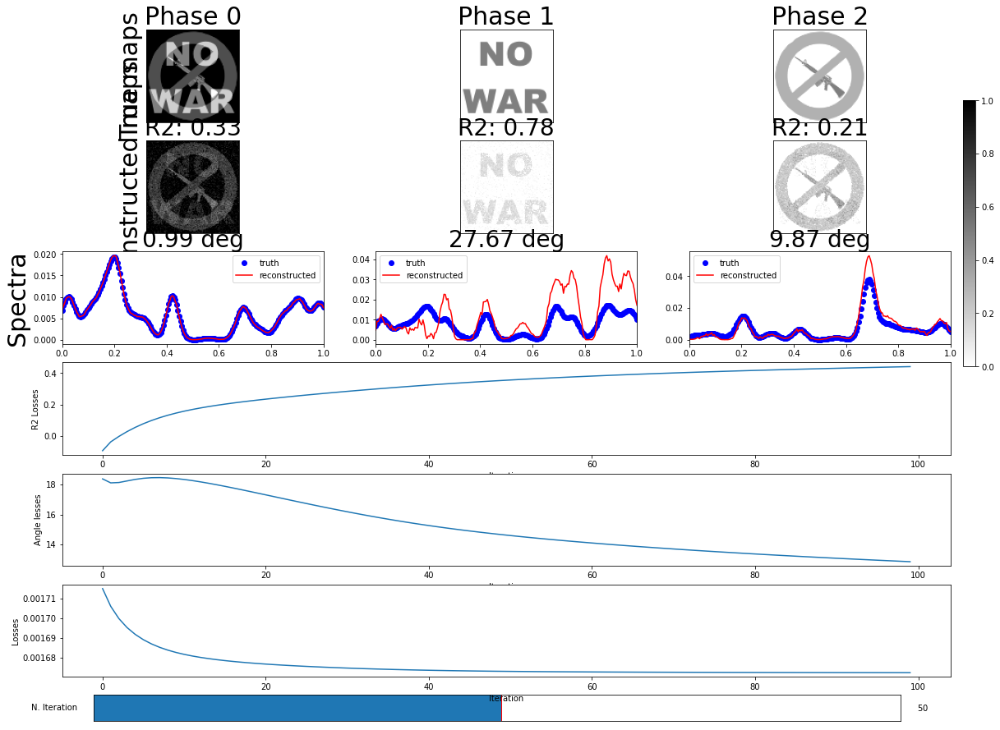

angles :  [0.9930054889850565, 9.86527968760369, 27.668795227457494]
mse :  [0.04903904084562555, 0.005237260643339785, 0.03433642205394393]
mae :  [0.15140872860830795, 0.04460272493370943, 0.09785452837675707]
r2 :  [0.33297582268155623, 0.7841843049792296, 0.20746266056590468]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.127 it/s
It 20 / 100: loss 0.002,  15.979 it/s
exits because of relative change < tol: 0.00010556131422341526
exits because of relative change < tol: 9.956647381038923e-05
exits because of relative change < tol: 9.409247031325157e-05
It 30 / 100: loss 0.002,  15.609 it/s
exits because of relative change < tol: 8.906272996177994e-05
exits because of relative change < tol: 8.441064639891252e-05
exits because of relative change < tol: 8.007717382701956e-05
exits because of relative change < tol: 7.600906216105145e-05
exits because of relative change < tol: 7.215799341698109e-05
exits because of relative change < tol: 6.848066151573819e-05
exits because of relative change < tol: 6.493961714940476e-05
exits because of relative change < tol: 6.150452390876133e-05
exits because of relative change < tol: 5.8153375155276795e-05
exits because of relative change < tol: 5.4873233320223556e-05
It 40 / 100: loss 0.002,  15.372 it/s
exits because of relative change < tol:

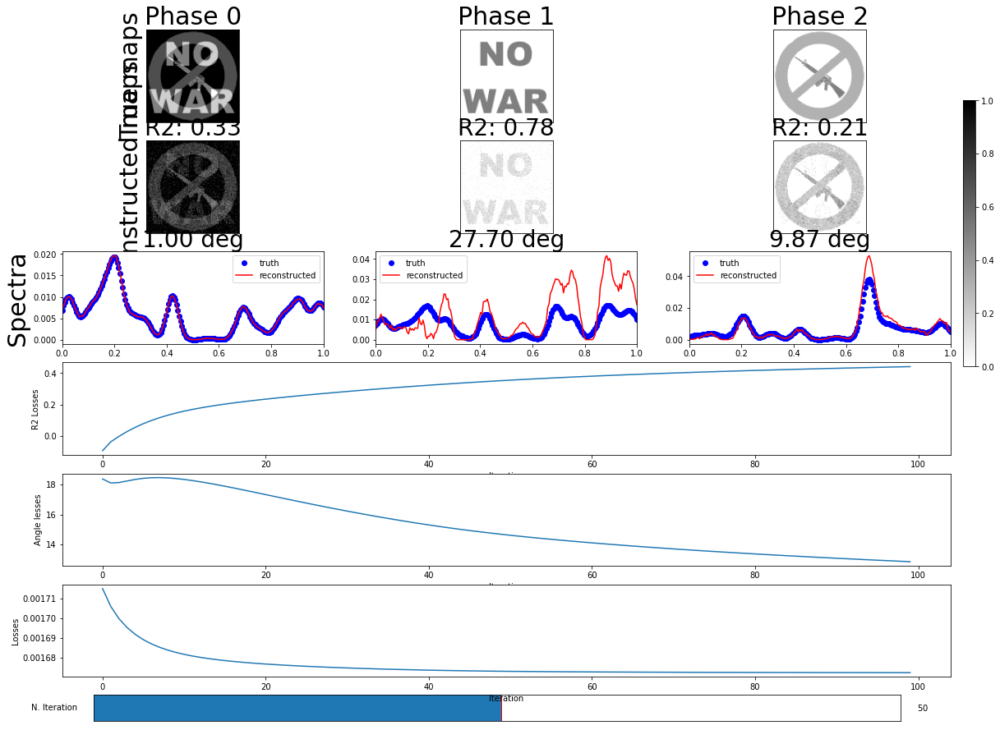

angles :  [0.997797624716334, 9.87000842735811, 27.703713380284437]
mse :  [0.04909441422446812, 0.005239387248930895, 0.03438852156686797]
mae :  [0.1514914096304153, 0.04462460535349329, 0.09793610214797961]
r2 :  [0.33222263946608344, 0.7840966723607797, 0.2062601238166255]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.097 it/s
It 20 / 100: loss 0.002,  14.511 it/s
exits because of relative change < tol: 0.00010332481347122924
exits because of relative change < tol: 9.728674430966456e-05
exits because of relative change < tol: 9.175432880796186e-05
It 30 / 100: loss 0.002,  12.604 it/s
exits because of relative change < tol: 8.666678746500302e-05
exits because of relative change < tol: 8.197844413823022e-05
exits because of relative change < tol: 7.765498811158932e-05
exits because of relative change < tol: 7.366949096786035e-05
exits because of relative change < tol: 6.999855089126852e-05
exits because of relative change < tol: 6.66188841959428e-05
exits because of relative change < tol: 6.350462873475124e-05
exits because of relative change < tol: 6.062557324667238e-05
exits because of relative change < tol: 5.794647628745834e-05
exits because of relative change < tol: 5.542757047330947e-05
It 40 / 100: loss 0.002,  13.650 it/s
exits because of relative change < tol: 5.

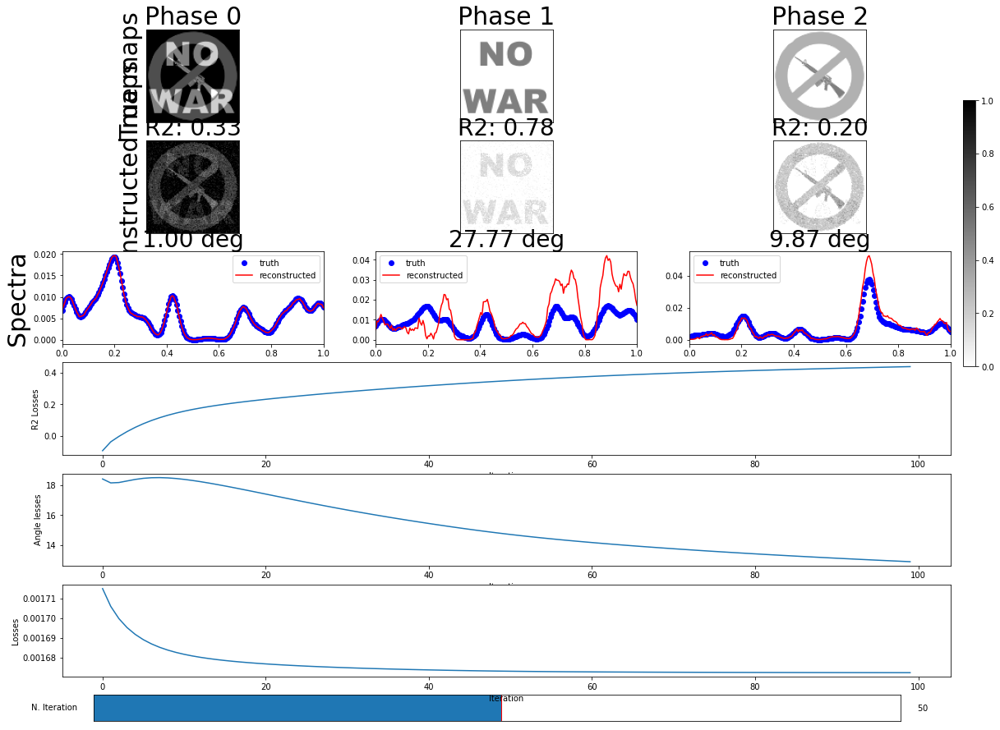

angles :  [0.9960831738596009, 9.874843946616087, 27.772243525191076]
mse :  [0.04920784559253356, 0.0052410969458556705, 0.03450910454189638]
mae :  [0.15159696112952648, 0.04464459758950952, 0.09808064312552936]
r2 :  [0.33067975723059817, 0.7840262196078573, 0.2034768836158869]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.571 it/s
It 20 / 100: loss 0.002,  14.142 it/s
exits because of relative change < tol: 0.00010321929573655268
exits because of relative change < tol: 9.727888756771605e-05
It 30 / 100: loss 0.002,  14.357 it/s
exits because of relative change < tol: 9.164675637137593e-05
exits because of relative change < tol: 8.627765588808468e-05
exits because of relative change < tol: 8.114401509641397e-05
exits because of relative change < tol: 7.62319082948683e-05
exits because of relative change < tol: 7.153684244927791e-05
exits because of relative change < tol: 6.705976624670283e-05
exits because of relative change < tol: 6.280363928269533e-05
exits because of relative change < tol: 5.877080312611268e-05
exits because of relative change < tol: 5.496127669866797e-05
exits because of relative change < tol: 5.137197152922455e-05
It 40 / 100: loss 0.002,  14.443 it/s
exits because of relative change < tol: 4.7996702979898637e-05
exits because of relative change < tol: 4

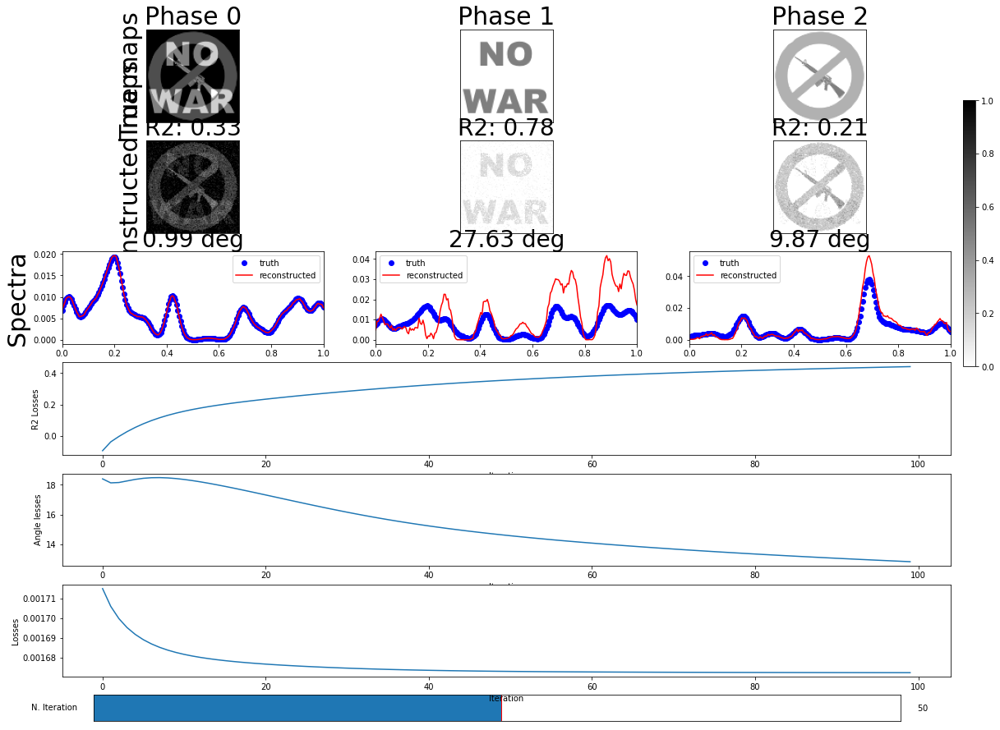

angles :  [0.9927316017069094, 9.868910580724593, 27.633865649596196]
mse :  [0.04903248116373285, 0.005240681263465926, 0.034318774111945165]
mae :  [0.15137364798096709, 0.04461760799366761, 0.0978435011534397]
r2 :  [0.3330650468250651, 0.7840433489412932, 0.20787000216300577]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.953 it/s
It 20 / 100: loss 0.002,  14.438 it/s
exits because of relative change < tol: 0.00010304419909925284
exits because of relative change < tol: 9.669461251307111e-05
It 30 / 100: loss 0.002,  14.572 it/s
exits because of relative change < tol: 9.070519567346837e-05
exits because of relative change < tol: 8.503918714411642e-05
exits because of relative change < tol: 7.967349798800684e-05
exits because of relative change < tol: 7.459465375388798e-05
exits because of relative change < tol: 6.979492739857845e-05
exits because of relative change < tol: 6.526902648338104e-05
exits because of relative change < tol: 6.101157320462714e-05
exits because of relative change < tol: 5.701548194191865e-05
exits because of relative change < tol: 5.32712112026895e-05
exits because of relative change < tol: 4.976676579217185e-05
It 40 / 100: loss 0.002,  14.605 it/s
exits because of relative change < tol: 4.648825411629818e-05
exits because of relative change < tol: 4.

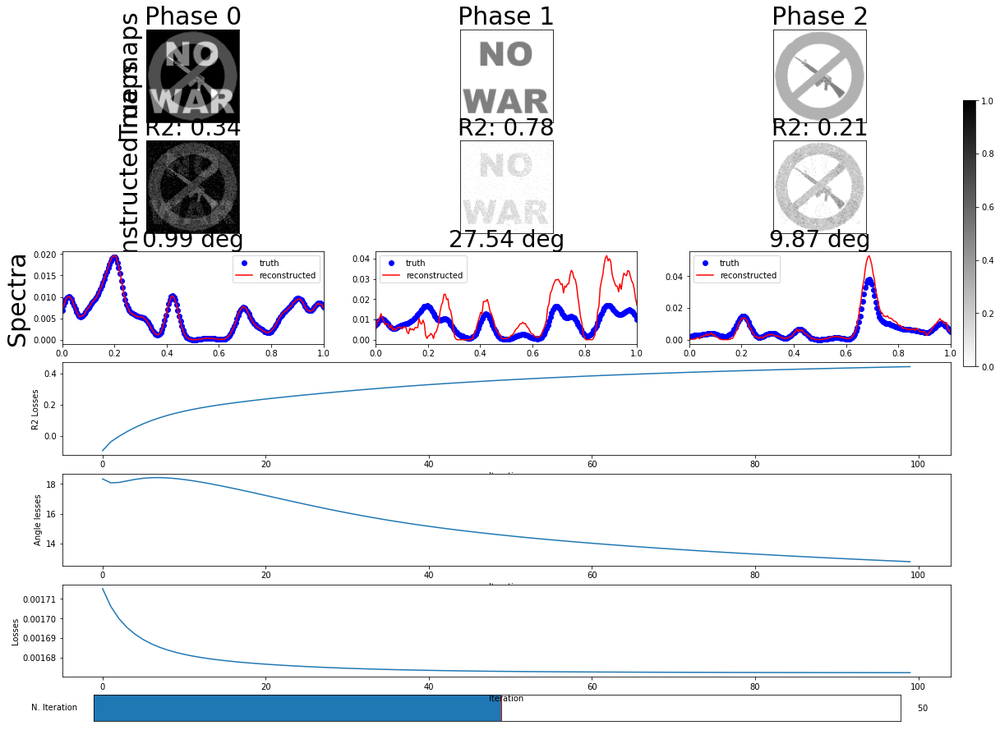

angles :  [0.9911843548742622, 9.868838044659821, 27.5386775187071]
mse :  [0.048843967062489946, 0.005233208164511656, 0.03415710673918493]
mae :  [0.15116151248207674, 0.044597085951358084, 0.09768092589676725]
r2 :  [0.3356291969618982, 0.7843512984887014, 0.21160153334232912]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.091 it/s
It 20 / 100: loss 0.002,  14.475 it/s
exits because of relative change < tol: 0.00010246113231638976
exits because of relative change < tol: 9.658276515831967e-05
It 30 / 100: loss 0.002,  14.466 it/s
exits because of relative change < tol: 9.103093017963248e-05
exits because of relative change < tol: 8.575396458762965e-05
exits because of relative change < tol: 8.071687073432037e-05
exits because of relative change < tol: 7.589833234417311e-05
exits because of relative change < tol: 7.128745768648185e-05
exits because of relative change < tol: 6.688049389316898e-05
exits because of relative change < tol: 6.26777548191508e-05
exits because of relative change < tol: 5.868099589129527e-05
exits because of relative change < tol: 5.489142534469066e-05
exits because of relative change < tol: 5.1308454459180944e-05
It 40 / 100: loss 0.002,  14.477 it/s
exits because of relative change < tol: 4.7929179951994964e-05
exits because of relative change < tol: 

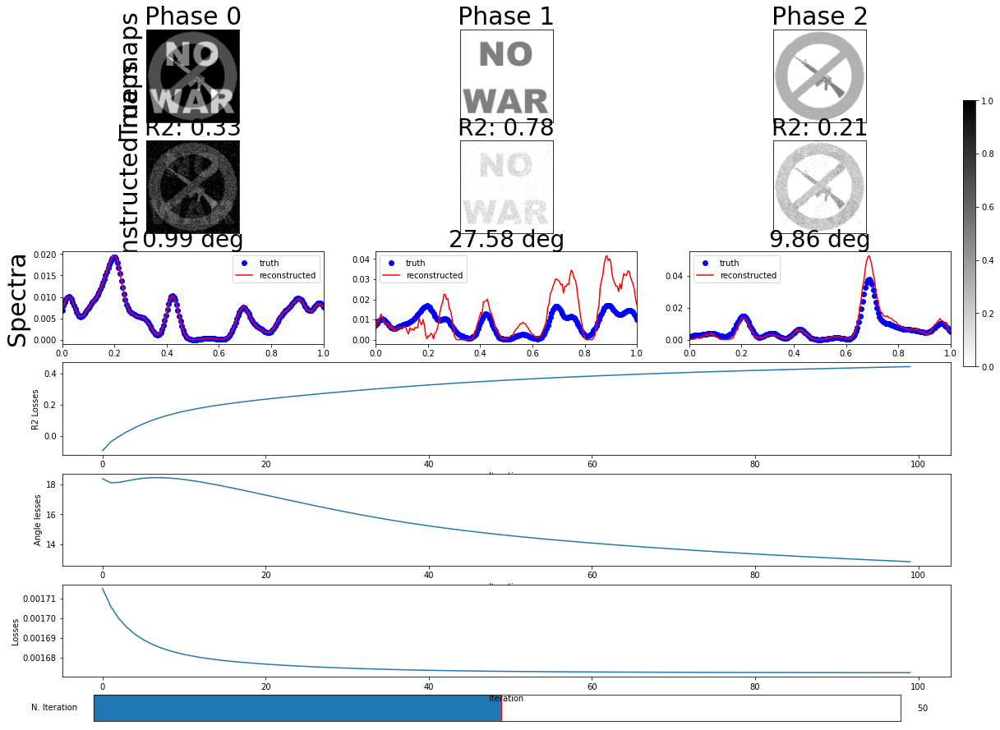

angles :  [0.9883717503289315, 9.85995188841369, 27.584156195476023]
mse :  [0.04898313318604976, 0.005231774808981197, 0.034254077523574136]
mae :  [0.15132931497289245, 0.044566775227942466, 0.09774140835781364]
r2 :  [0.3337362731306531, 0.784410363836234, 0.20936329875452264]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.831 it/s
It 20 / 100: loss 0.002,  15.772 it/s
exits because of relative change < tol: 0.00010789354575446838
exits because of relative change < tol: 0.00010177741070173858
exits because of relative change < tol: 9.611612577547827e-05
It 30 / 100: loss 0.002,  15.542 it/s
exits because of relative change < tol: 9.0828430894305e-05
exits because of relative change < tol: 8.584796274174836e-05
exits because of relative change < tol: 8.112204215683706e-05
exits because of relative change < tol: 7.661043420317701e-05
exits because of relative change < tol: 7.228409762313279e-05
exits because of relative change < tol: 6.812384514960362e-05
exits because of relative change < tol: 6.411881456303661e-05
exits because of relative change < tol: 6.0264712634496415e-05
exits because of relative change < tol: 5.656189817111926e-05
exits because of relative change < tol: 5.301346717724079e-05
It 40 / 100: loss 0.002,  15.371 it/s
exits because of relative change < tol: 4

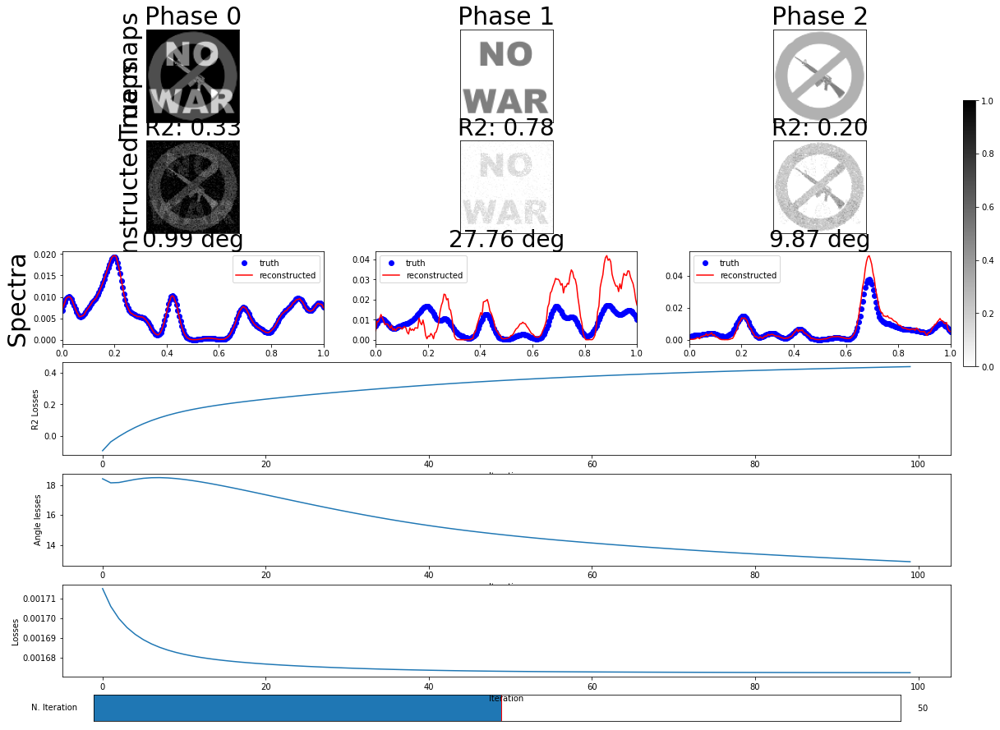

angles :  [0.9900395571468733, 9.87122557861159, 27.75743291441945]
mse :  [0.04919387465556605, 0.005240547297437986, 0.03444937031213343]
mae :  [0.15155075714069502, 0.044612806415984696, 0.09801872397948741]
r2 :  [0.3308697885317089, 0.784048869379056, 0.20485564135177148]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.998 it/s
It 20 / 100: loss 0.002,  14.532 it/s
exits because of relative change < tol: 0.00010369213752354184
exits because of relative change < tol: 9.75436927766757e-05
It 30 / 100: loss 0.002,  13.993 it/s
exits because of relative change < tol: 9.171833330652892e-05
exits because of relative change < tol: 8.617952534540508e-05
exits because of relative change < tol: 8.090592874278015e-05
exits because of relative change < tol: 7.588705978344949e-05
exits because of relative change < tol: 7.11190691496101e-05
exits because of relative change < tol: 6.660104042843275e-05
exits because of relative change < tol: 6.233209216413567e-05
exits because of relative change < tol: 5.83094252319208e-05
exits because of relative change < tol: 5.4527324694825966e-05
exits because of relative change < tol: 5.097700829168419e-05
It 40 / 100: loss 0.002,  14.848 it/s
exits because of relative change < tol: 4.764712785043633e-05
exits because of relative change < tol: 4.4

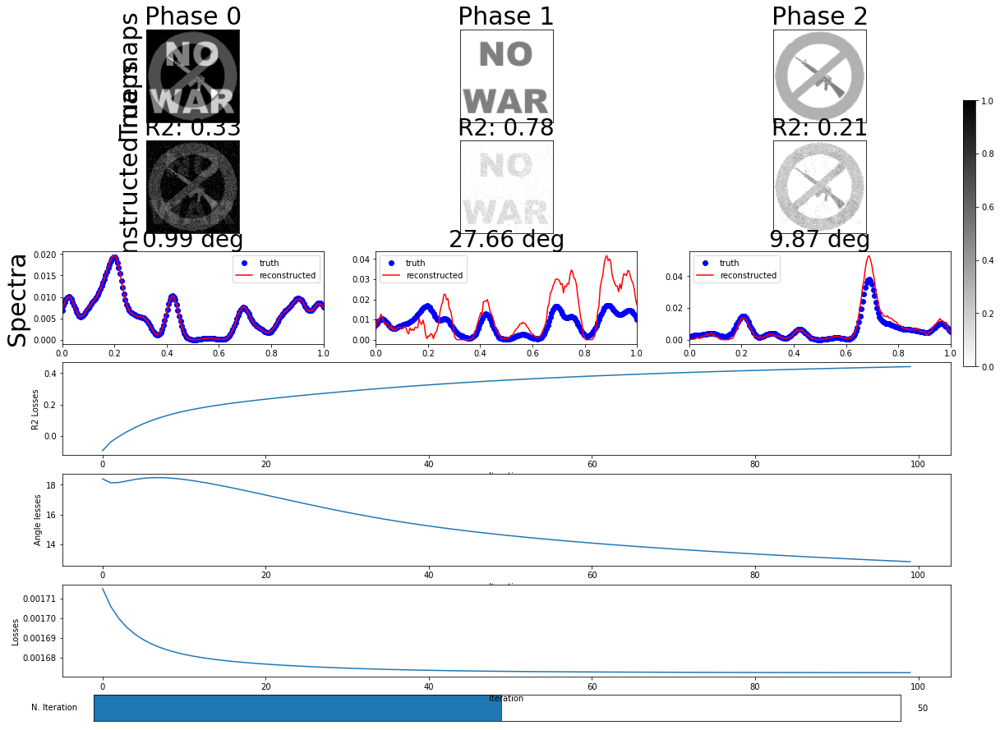

angles :  [0.9900950489456616, 9.86562233702152, 27.664358637853656]
mse :  [0.049068539139676785, 0.0052413144478527475, 0.034326506767399505]
mae :  [0.15140723086028407, 0.044627568183253565, 0.09785585730354598]
r2 :  [0.3325745898070438, 0.7840172568412769, 0.20769152060278617]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  14.022 it/s
It 20 / 100: loss 0.002,  14.464 it/s
exits because of relative change < tol: 0.00010271177649309622
exits because of relative change < tol: 9.654857936049258e-05
It 30 / 100: loss 0.002,  14.639 it/s
exits because of relative change < tol: 9.073358056198174e-05
exits because of relative change < tol: 8.522882375403512e-05
exits because of relative change < tol: 8.001034295542444e-05
exits because of relative change < tol: 7.506397323509509e-05
exits because of relative change < tol: 7.03813937305011e-05
exits because of relative change < tol: 6.595678143263155e-05
exits because of relative change < tol: 6.178431177447167e-05
exits because of relative change < tol: 5.7856591235202645e-05
exits because of relative change < tol: 5.4163981055401924e-05
exits because of relative change < tol: 5.069466546444768e-05
It 40 / 100: loss 0.002,  14.606 it/s
exits because of relative change < tol: 4.7435255365611255e-05
exits because of relative change < tol:

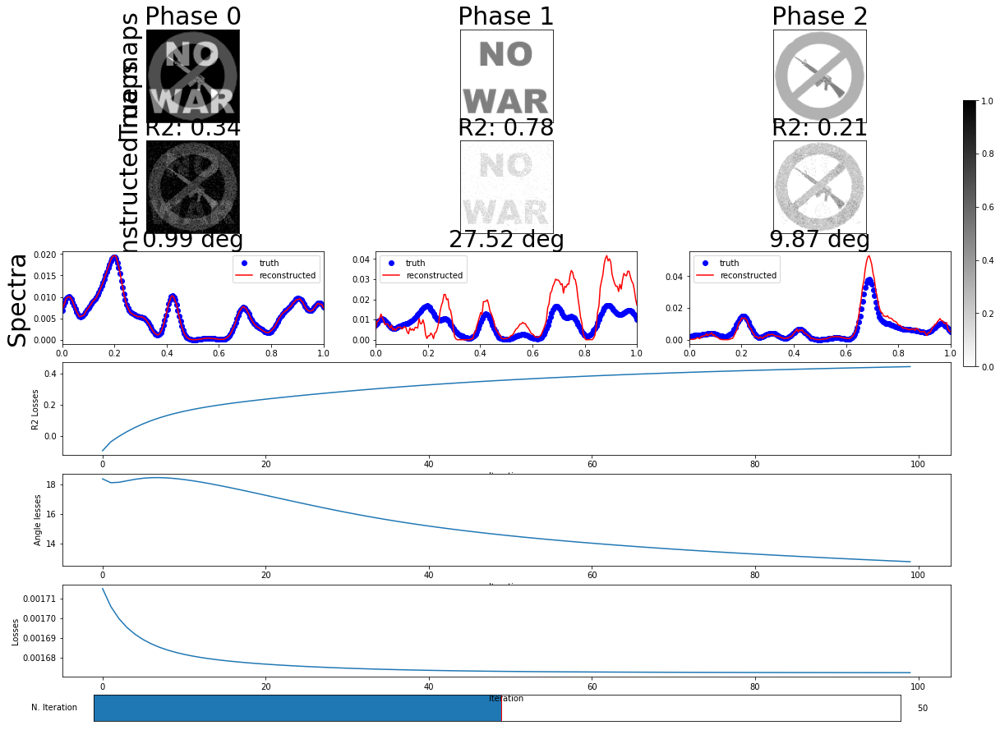

angles :  [0.9897413789518597, 9.865701147529062, 27.521193645868763]
mse :  [0.04885403275287429, 0.005235505183077878, 0.034174342406936196]
mae :  [0.15113063492256257, 0.04460681488516794, 0.09765658557080287]
r2 :  [0.33549228443808077, 0.7842566435360259, 0.21120370766784569]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.803 it/s
It 20 / 100: loss 0.002,  14.321 it/s
exits because of relative change < tol: 0.0001026065078598902
exits because of relative change < tol: 9.676984709359792e-05
It 30 / 100: loss 0.002,  14.533 it/s
exits because of relative change < tol: 9.127104665558685e-05
exits because of relative change < tol: 8.60533948172684e-05
exits because of relative change < tol: 8.107694193782031e-05
exits because of relative change < tol: 7.631599784846742e-05
exits because of relative change < tol: 7.175622984462237e-05
exits because of relative change < tol: 6.739156235702972e-05
exits because of relative change < tol: 6.32211122691076e-05
exits because of relative change < tol: 5.9246417127253835e-05
exits because of relative change < tol: 5.5469193559577505e-05
exits because of relative change < tol: 5.188979318904744e-05
It 40 / 100: loss 0.002,  14.561 it/s
exits because of relative change < tol: 4.850640870191254e-05
exits because of relative change < tol: 4.

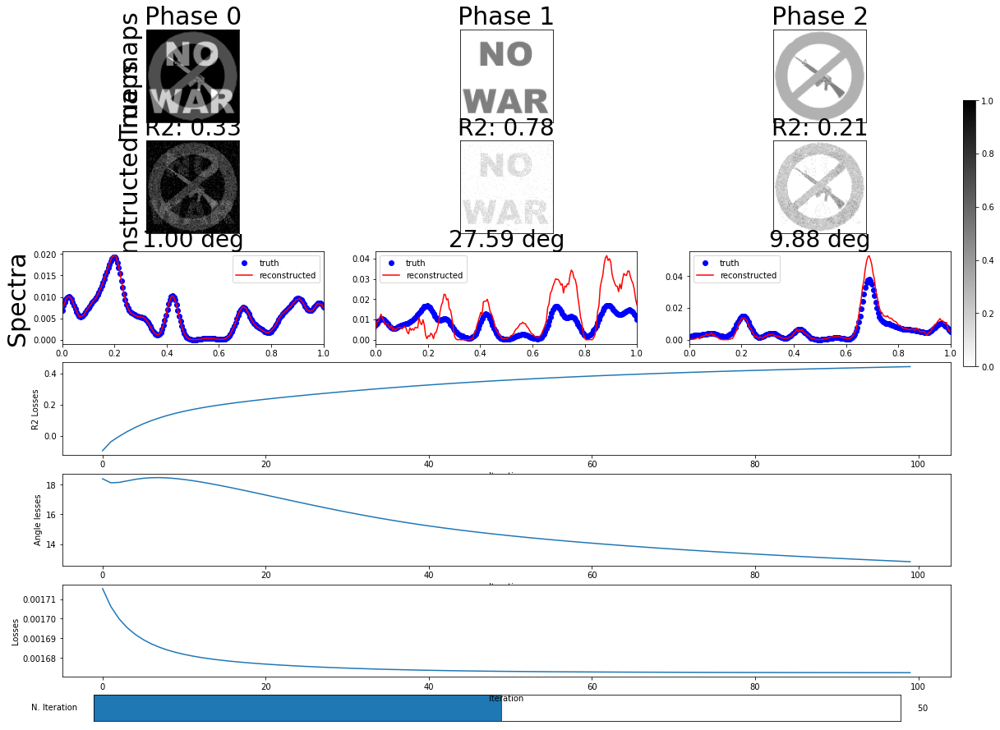

angles :  [0.9961276925366594, 9.877868251257368, 27.58734543858159]
mse :  [0.04901532996276022, 0.00524602570741532, 0.034271882474947106]
mae :  [0.1513838628180636, 0.044644498718560105, 0.09780019423838135]
r2 :  [0.33329833576223666, 0.7838231164640526, 0.2089523331400006]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.666 it/s
It 20 / 100: loss 0.002,  14.336 it/s
exits because of relative change < tol: 0.00010458980774482815
exits because of relative change < tol: 9.839647104494915e-05
exits because of relative change < tol: 9.273980778773954e-05
It 30 / 100: loss 0.002,  14.481 it/s
exits because of relative change < tol: 8.755964292410311e-05
exits because of relative change < tol: 8.280769428927979e-05
exits because of relative change < tol: 7.844367842377282e-05
exits because of relative change < tol: 7.443155004362728e-05
exits because of relative change < tol: 7.073625660014323e-05
exits because of relative change < tol: 6.73213137343979e-05
exits because of relative change < tol: 6.41474306837974e-05
exits because of relative change < tol: 6.117232939702469e-05
exits because of relative change < tol: 5.8351789961623877e-05
exits because of relative change < tol: 5.564180540009321e-05
It 40 / 100: loss 0.002,  14.568 it/s
exits because of relative change < tol: 5.

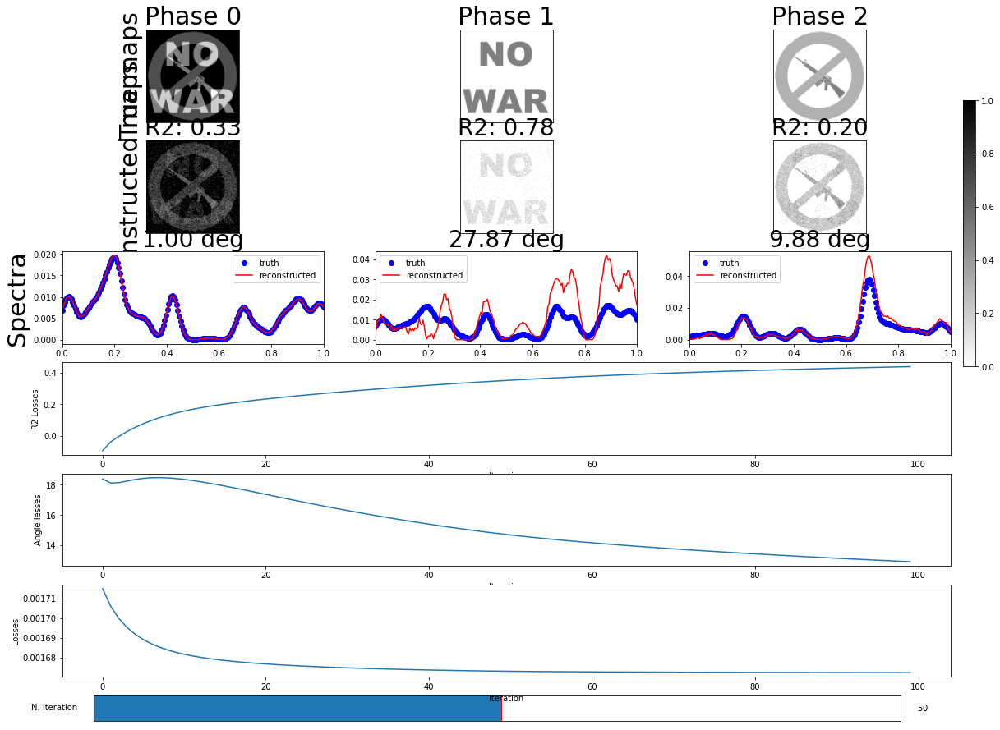

angles :  [0.9957668205525664, 9.877055540183774, 27.866252878322356]
mse :  [0.04929621231058898, 0.005241876087830201, 0.03454849841605303]
mae :  [0.1516997202867935, 0.044624763008034446, 0.09817868782068791]
r2 :  [0.3294778018824338, 0.7839941129249549, 0.20256761251696276]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.915 it/s
It 20 / 100: loss 0.002,  13.129 it/s
exits because of relative change < tol: 0.00010296790745856174
exits because of relative change < tol: 9.70941538713928e-05
It 30 / 100: loss 0.002,  13.507 it/s
exits because of relative change < tol: 9.154766838256277e-05
exits because of relative change < tol: 8.627555228091667e-05
exits because of relative change < tol: 8.124188613915415e-05
exits because of relative change < tol: 7.642480708372698e-05
exits because of relative change < tol: 7.181325698759016e-05
exits because of relative change < tol: 6.740364390050298e-05
exits because of relative change < tol: 6.319666998673209e-05
exits because of relative change < tol: 5.919457683207494e-05
exits because of relative change < tol: 5.539902047090387e-05
exits because of relative change < tol: 5.180970432216554e-05
It 40 / 100: loss 0.002,  13.716 it/s
exits because of relative change < tol: 4.842378434540117e-05
exits because of relative change < tol: 4.

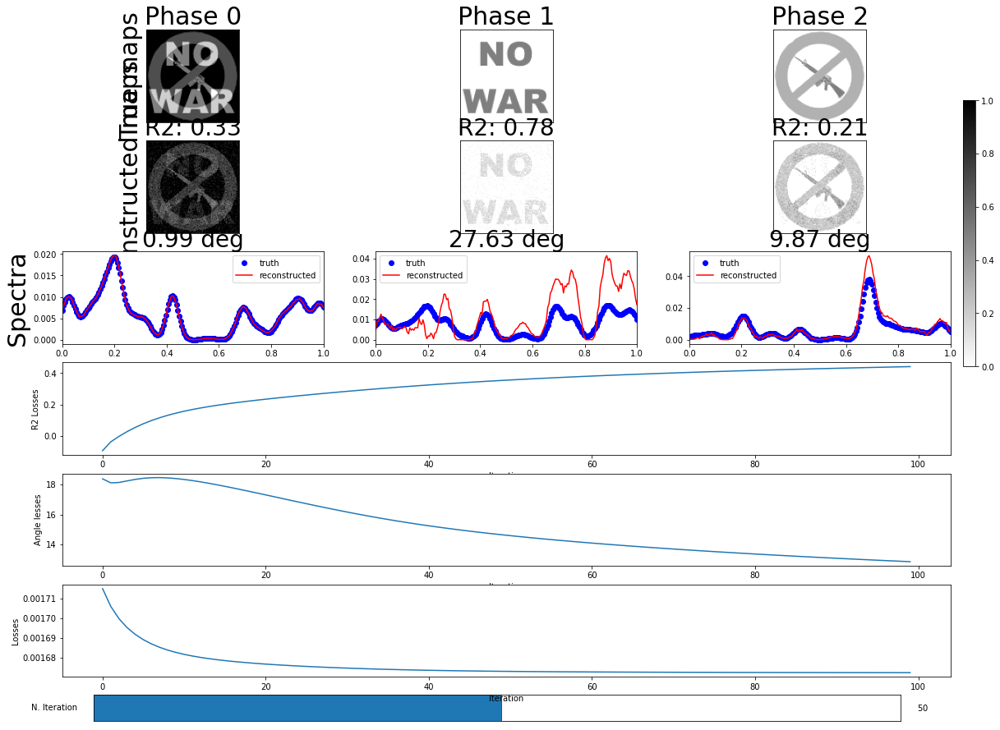

angles :  [0.9945428646883143, 9.870887144772675, 27.631539614156498]
mse :  [0.04902644936554158, 0.005243284711443902, 0.034306015766015094]
mae :  [0.1513628581024555, 0.04464133039801021, 0.09783542528475994]
r2 :  [0.33314709074674265, 0.7839360667239127, 0.20816448437559953]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.155 it/s
It 20 / 100: loss 0.002,  13.910 it/s
exits because of relative change < tol: 0.00010217461532903398
exits because of relative change < tol: 9.580175122640636e-05
exits because of relative change < tol: 8.996650807846974e-05
It 30 / 100: loss 0.002,  14.174 it/s
exits because of relative change < tol: 8.461389443348324e-05
exits because of relative change < tol: 7.970219683776092e-05
exits because of relative change < tol: 7.519943967835218e-05
exits because of relative change < tol: 7.10798238121512e-05
exits because of relative change < tol: 6.732042575277944e-05
exits because of relative change < tol: 6.389834556912635e-05
exits because of relative change < tol: 6.078841971924383e-05
exits because of relative change < tol: 5.796157813990967e-05
exits because of relative change < tol: 5.5383921008381026e-05
exits because of relative change < tol: 5.301659111138811e-05
It 40 / 100: loss 0.002,  14.467 it/s
exits because of relative change < tol: 5

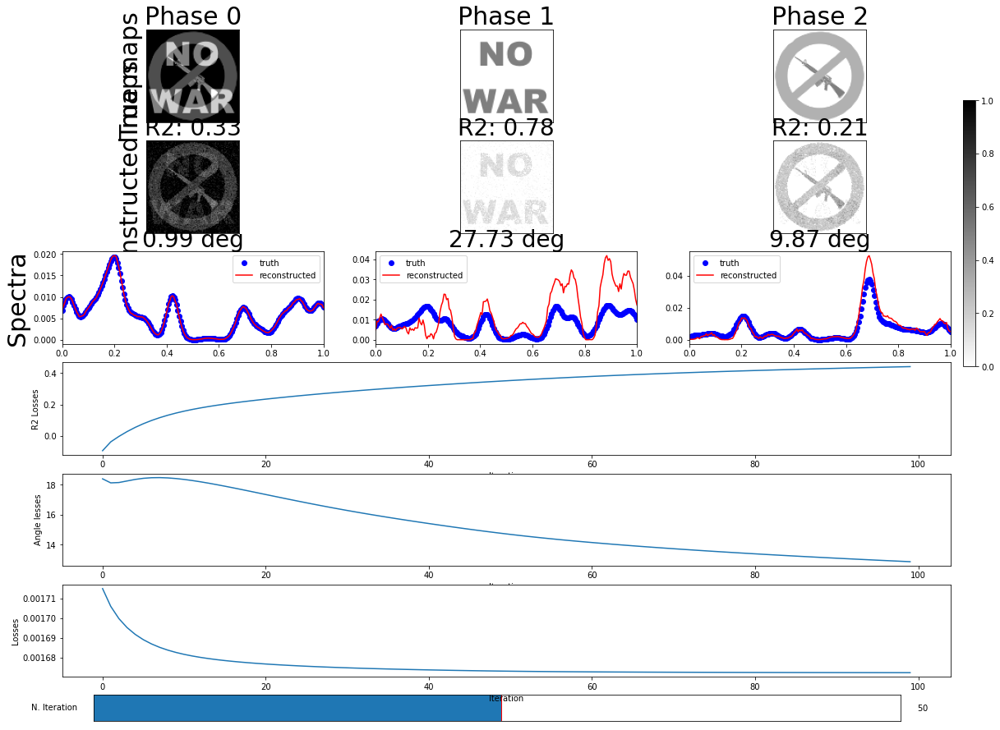

angles :  [0.9916612613661682, 9.865557725564006, 27.72700250602423]
mse :  [0.04911753508329371, 0.005225553031178815, 0.03441571957271307]
mae :  [0.15156407631334706, 0.044551107176771826, 0.09795220986656725]
r2 :  [0.33190815183396216, 0.784666749262152, 0.20563235208325958]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.829 it/s
It 20 / 100: loss 0.002,  14.422 it/s
exits because of relative change < tol: 0.00010176156649620395
exits because of relative change < tol: 9.53636406714432e-05
exits because of relative change < tol: 8.949526928165806e-05
It 30 / 100: loss 0.002,  14.524 it/s
exits because of relative change < tol: 8.409773722472184e-05
exits because of relative change < tol: 7.912662381754154e-05
exits because of relative change < tol: 7.454882506514933e-05
exits because of relative change < tol: 7.033952770850902e-05
exits because of relative change < tol: 6.647931669166138e-05
exits because of relative change < tol: 6.29515148463584e-05
exits because of relative change < tol: 5.9739810328165684e-05
exits because of relative change < tol: 5.682622088685123e-05
exits because of relative change < tol: 5.41894583539188e-05
exits because of relative change < tol: 5.180376504765328e-05
It 40 / 100: loss 0.002,  14.523 it/s
exits because of relative change < tol: 4.9

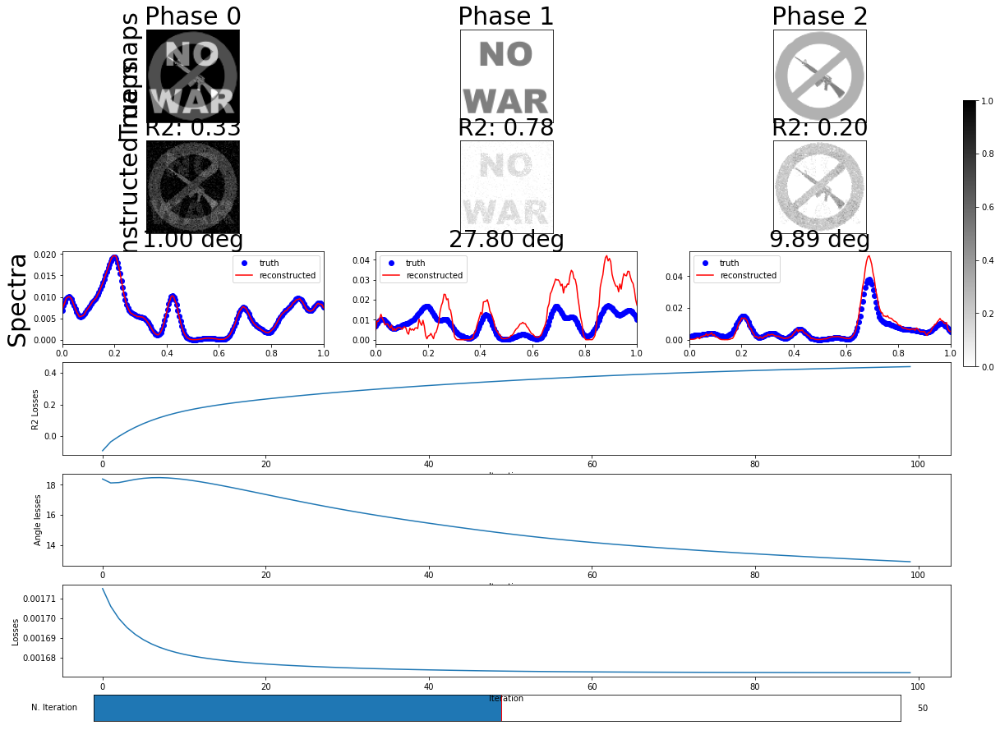

angles :  [0.9987081974708802, 9.88545889235413, 27.799541173472058]
mse :  [0.04917929750007804, 0.0052354584291423945, 0.03451376603265796]
mae :  [0.1515693883550019, 0.04461134510974555, 0.09810338164675532]
r2 :  [0.33106806555710266, 0.7842585701602228, 0.2033692892520893]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.809 it/s
It 20 / 100: loss 0.002,  14.345 it/s
exits because of relative change < tol: 0.00010338307643810827
exits because of relative change < tol: 9.723999170291878e-05
It 30 / 100: loss 0.002,  14.508 it/s
exits because of relative change < tol: 9.142232822254878e-05
exits because of relative change < tol: 8.589191624185372e-05
exits because of relative change < tol: 8.062636294167638e-05
exits because of relative change < tol: 7.561464348293435e-05
exits because of relative change < tol: 7.085278486638699e-05
exits because of relative change < tol: 6.63400607877507e-05
exits because of relative change < tol: 6.20759882997188e-05
exits because of relative change < tol: 5.805827683052614e-05
exits because of relative change < tol: 5.4281742041026644e-05
exits because of relative change < tol: 5.073808155456803e-05
It 40 / 100: loss 0.002,  14.544 it/s
exits because of relative change < tol: 4.741632018077817e-05
exits because of relative change < tol: 4.

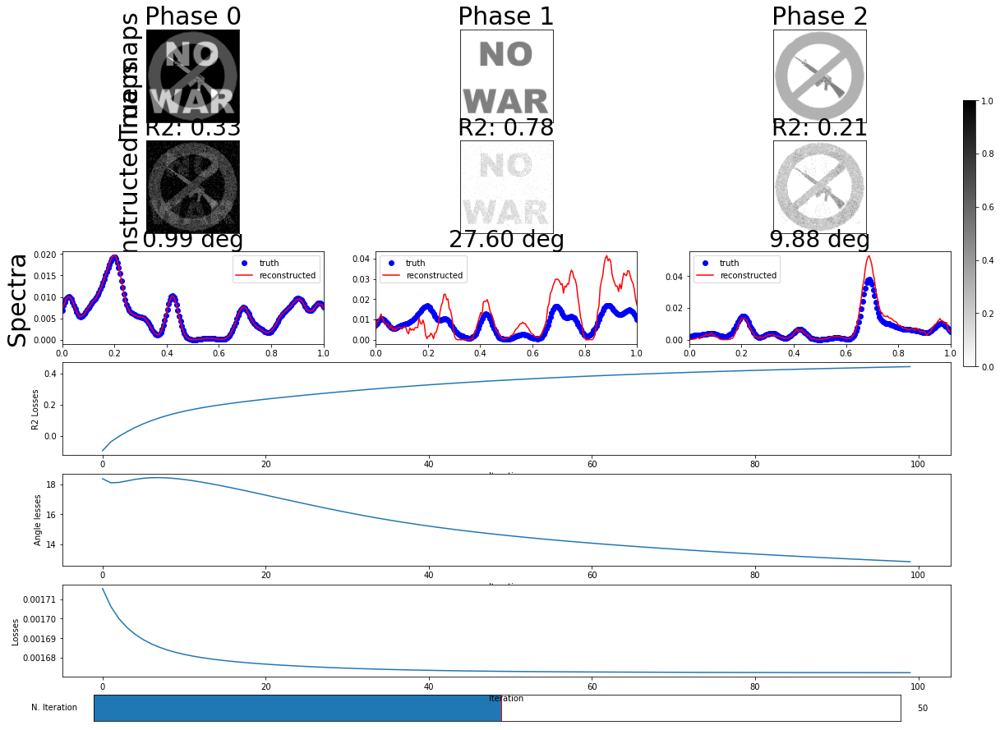

angles :  [0.9927422040099843, 9.875786287338308, 27.603841032292312]
mse :  [0.04899837215655202, 0.005244526076602326, 0.034266009410743925]
mae :  [0.15134138346924222, 0.04464333696710294, 0.09779083710445595]
r2 :  [0.3335289941629742, 0.7838849128664509, 0.2090878924790197]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.447 it/s
It 20 / 100: loss 0.002,  14.188 it/s
exits because of relative change < tol: 0.0001034437163797722
exits because of relative change < tol: 9.719800351384197e-05
It 30 / 100: loss 0.002,  14.336 it/s
exits because of relative change < tol: 9.128475401752873e-05
exits because of relative change < tol: 8.56699428396263e-05
exits because of relative change < tol: 8.033428885435845e-05
exits because of relative change < tol: 7.526850985048842e-05
exits because of relative change < tol: 7.046886516794194e-05
exits because of relative change < tol: 6.593345265004083e-05
exits because of relative change < tol: 6.165952678331136e-05
exits because of relative change < tol: 5.764190554573431e-05
exits because of relative change < tol: 5.387237581128111e-05
exits because of relative change < tol: 5.03398954079757e-05
It 40 / 100: loss 0.002,  14.475 it/s
exits because of relative change < tol: 4.703133594264182e-05
exits because of relative change < tol: 4.39

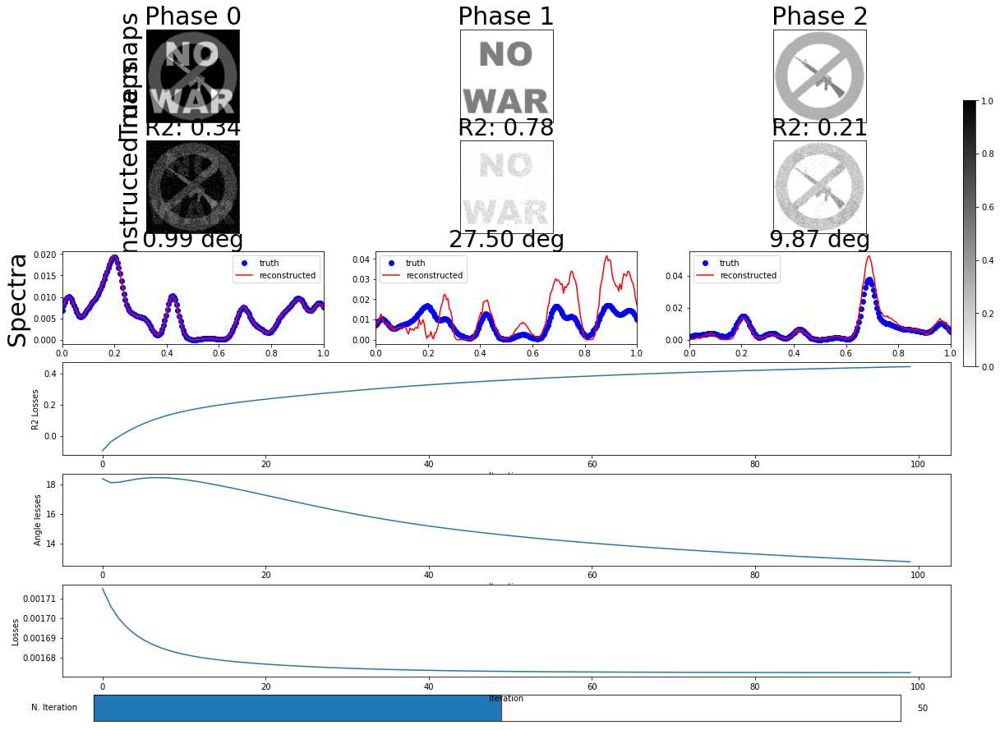

angles :  [0.9860142133130517, 9.865433945377251, 27.496395965558335]
mse :  [0.048841014433429975, 0.005239422748481484, 0.034119995089818854]
mae :  [0.15105494564936667, 0.04460134364074992, 0.0976064348940806]
r2 :  [0.33566935832997746, 0.7840952095043926, 0.21245812718907275]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  10.671 it/s
It 20 / 100: loss 0.002,  12.513 it/s
exits because of relative change < tol: 0.00010860418553026089
exits because of relative change < tol: 0.00010237349975108253
exits because of relative change < tol: 9.655143101537688e-05
It 30 / 100: loss 0.002,  13.035 it/s
exits because of relative change < tol: 9.106405885341144e-05
exits because of relative change < tol: 8.585596860441979e-05
exits because of relative change < tol: 8.088820865607556e-05
exits because of relative change < tol: 7.613569787712234e-05
exits because of relative change < tol: 7.158427513624775e-05
exits because of relative change < tol: 6.722762086081224e-05
exits because of relative change < tol: 6.3064298682136e-05
exits because of relative change < tol: 5.9095166178332104e-05
exits because of relative change < tol: 5.5321354238493845e-05
exits because of relative change < tol: 5.1742927566531024e-05
It 40 / 100: loss 0.002,  13.302 it/s
exits because of relative change < tol:

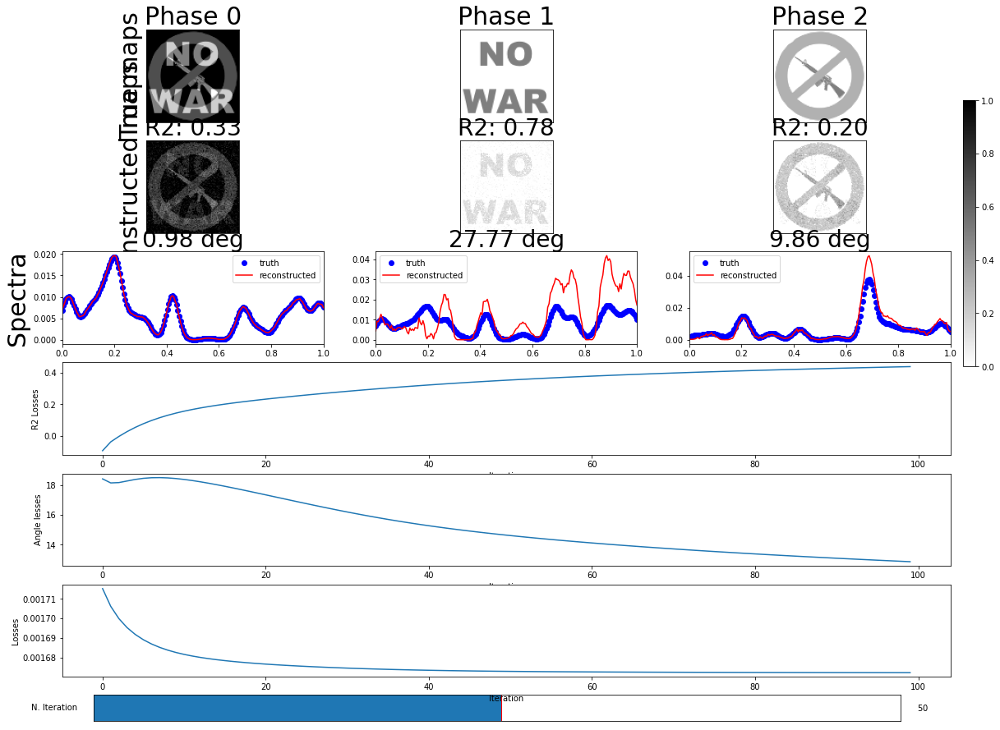

angles :  [0.9817131151285795, 9.859967922730208, 27.77420105152933]
mse :  [0.04922973671792328, 0.005232813487563584, 0.03447926260038171]
mae :  [0.1515599441938189, 0.04457740089851363, 0.09798408160625172]
r2 :  [0.33038199631089293, 0.7843675622352776, 0.20416568144387326]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  11.580 it/s
It 20 / 100: loss 0.002,  12.942 it/s
exits because of relative change < tol: 0.00010211592664143762
exits because of relative change < tol: 9.580430311696258e-05
exits because of relative change < tol: 9.002124062482804e-05
It 30 / 100: loss 0.002,  13.527 it/s
exits because of relative change < tol: 8.471010860027539e-05
exits because of relative change < tol: 7.982822069434448e-05
exits because of relative change < tol: 7.53433791553308e-05
exits because of relative change < tol: 7.123033925215558e-05
exits because of relative change < tol: 6.746748586688965e-05
exits because of relative change < tol: 6.403392119150403e-05
exits because of relative change < tol: 6.090708344282229e-05
exits because of relative change < tol: 5.8060972615613235e-05
exits because of relative change < tol: 5.546504274951776e-05
exits because of relative change < tol: 5.308381980698843e-05
It 40 / 100: loss 0.002,  14.485 it/s
exits because of relative change < tol: 5

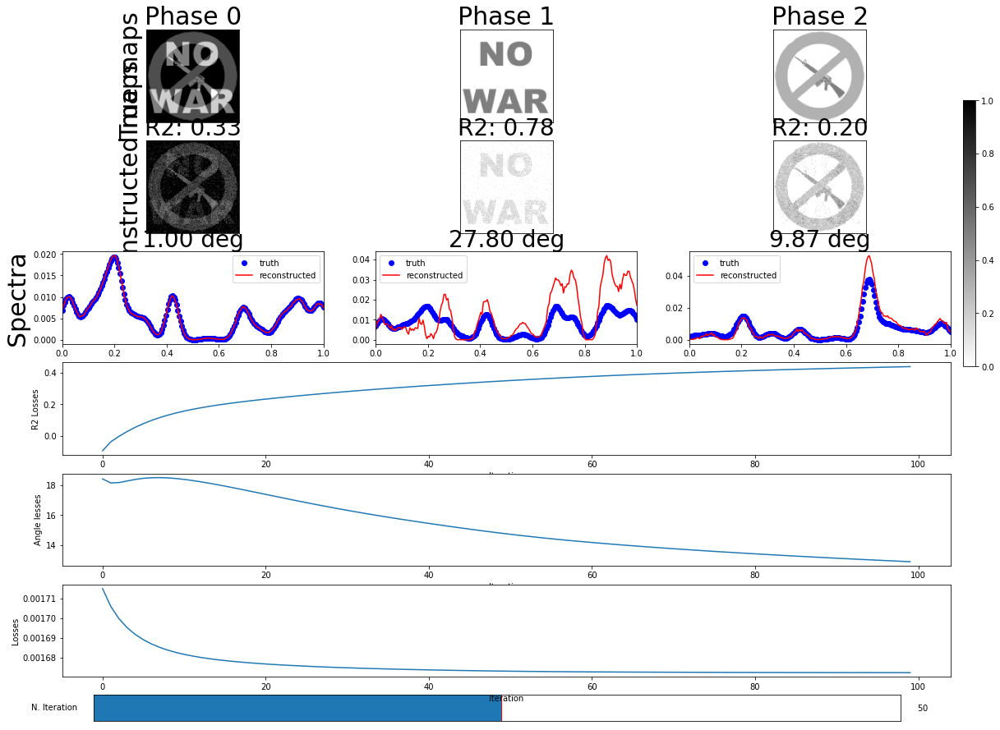

angles :  [0.9993153971033676, 9.874320307465982, 27.800802677391108]
mse :  [0.04921947211030731, 0.005245955453201793, 0.03453133999563138]
mae :  [0.1515948374658884, 0.0446639762180012, 0.09812229280144948]
r2 :  [0.3305216144871964, 0.7838260114816873, 0.202963655204477]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  11.661 it/s
It 20 / 100: loss 0.002,  12.954 it/s
exits because of relative change < tol: 0.00010250336798110398
exits because of relative change < tol: 9.655266321240384e-05
It 30 / 100: loss 0.002,  13.516 it/s
exits because of relative change < tol: 9.0942199973976e-05
exits because of relative change < tol: 8.56222090455869e-05
exits because of relative change < tol: 8.055920863756224e-05
exits because of relative change < tol: 7.573278943838032e-05
exits because of relative change < tol: 7.113211667788981e-05
exits because of relative change < tol: 6.675247353295169e-05
exits because of relative change < tol: 6.259215323936376e-05
exits because of relative change < tol: 5.864995852301177e-05
exits because of relative change < tol: 5.4923475640147036e-05
exits because of relative change < tol: 5.14081724208071e-05
It 40 / 100: loss 0.002,  13.690 it/s
exits because of relative change < tol: 4.8097244078603476e-05
exits because of relative change < tol: 4.4

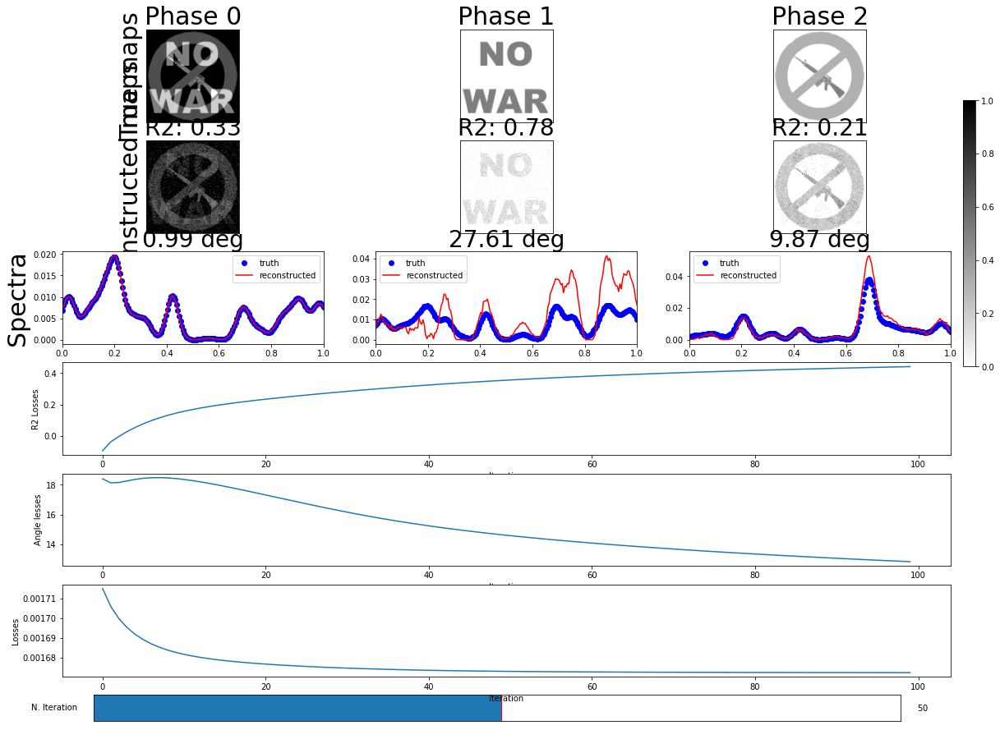

angles :  [0.992280360711423, 9.86917693976888, 27.613189142633043]
mse :  [0.049037051028699645, 0.005241060243101913, 0.034308487256823506]
mae :  [0.15138817453249814, 0.044630135420833696, 0.09781625034120126]
r2 :  [0.33300288797433364, 0.7840277320455324, 0.20810743857313763]
3


/Users/maxmartinezruts/.local/share/virtualenvs/esmpy-kBfF6zeU/lib/python3.8/site-packages/sklearn/decomposition/_nmf.py:289: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(


It 10 / 100: loss 0.002,  13.958 it/s
It 20 / 100: loss 0.002,  14.492 it/s
exits because of relative change < tol: 0.00010738204830817634
exits because of relative change < tol: 0.00010132250864577208
exits because of relative change < tol: 9.572628709013522e-05
It 30 / 100: loss 0.002,  14.679 it/s
exits because of relative change < tol: 9.051383093240759e-05
exits because of relative change < tol: 8.561905269662711e-05
exits because of relative change < tol: 8.098801540419339e-05
exits because of relative change < tol: 7.657791113104643e-05
exits because of relative change < tol: 7.235626199791881e-05
exits because of relative change < tol: 6.83001419098001e-05
exits because of relative change < tol: 6.439519056242544e-05
exits because of relative change < tol: 6.063427087757824e-05
exits because of relative change < tol: 5.7015768256032354e-05
exits because of relative change < tol: 5.354167851465663e-05
It 40 / 100: loss 0.002,  14.670 it/s
exits because of relative change < tol: 

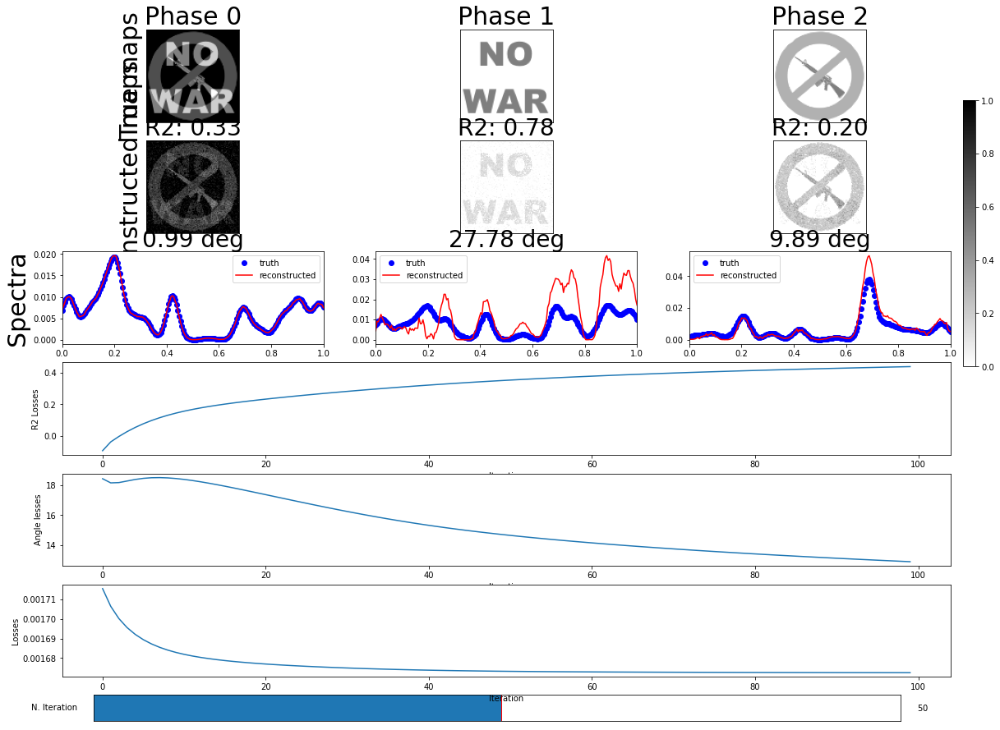

angles :  [0.9858446581724438, 9.891543437848338, 27.783965822259624]
mse :  [0.049326284734637335, 0.005258001756925944, 0.03449839863845807]
mae :  [0.15166787957499278, 0.04471310197928528, 0.09807250508393461]
r2 :  [0.32906875974855576, 0.7833296104835883, 0.20372399230455296]


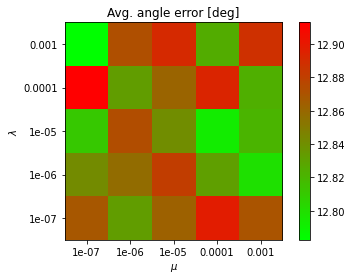

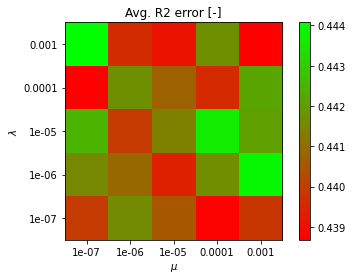

In [136]:

import time
from scipy import ndimage
import random


mu = 0
lambda_L = 0
force_simplex = False
Gused = None

params = {}
params["tol"]=1e-4
params["max_iter"] = 100
params["hspy_comp"] = False
params["verbose"] = 1
params["epsilon_reg"] = 1
params["linesearch"] = False
# params["shape_2d"] = shape_2d
params["n_components"] = K

n = 5
m = 5

downsampling_factors = [1]
angles = []
r2s = []

angle_max_exp = []
r2_max_exp = []
times_exp = []

pixels_side = 100
Ximg = Y.reshape((-1, pixels_side,pixels_side))

lambdas = [10**((i//n)-7) for i in range(n*m)]
mus = [10**((i%n)-7) for i in range(n*m)]
for j in range(n*m):
    angle_max_exp.append([])
    r2_max_exp.append([])
    times_exp.append([])

    Hflat =None
    W = None

    for i in range(len(downsampling_factors)):
        start_time = time.time()
        n = downsampling_factors[i]
        X = downsample(Ximg,n)
        Xflat = X.reshape((X.shape[0], -1))
        if (i > 0):
            factor = downsampling_factors[i-1]//downsampling_factors[i]
            H = Hflat.reshape((-1, pixels_side//n//factor, pixels_side//n//factor))
            H = H.repeat(factor, axis = 1).repeat(factor, axis = 2)
            Hflat = H.reshape((-1, pixels_side*pixels_side//n//n)) +0.001
            W =  W 

        
        est = SmoothNMF( n_components = 3,tol=0.0001, max_iter = 100, G = None, lambda_L=lambdas[j], mu=mus[j], force_simplex=False)

        if i > 0:
            D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=False)

        else:
            D , Hs, Ws, G, losses = est.fit_transform(Xflat, W=W, H=Hflat, update_W=True)


        Hflat = est.H_
        W = est.W_

        # Wdot = spim.phases
        Hdotflat_down = downsample_flat(Hdotflat, n, pixels_side)
        times_exp[-1].append(time.time()-start_time)

        angle, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
        r2 = ordered_r2(Hdotflat_down, Hflat, true_inds)

        angle_max_exp[-1].append(sum(angle)/len(angle))
        r2_max_exp[-1].append(sum(r2)/len(r2))

        plot_results(Ddot, D, Hdotflat_down, Hflat, pixels_side//n, Hs, Ws, G, losses)

    angles.append(sum(angle)/len(angle))
    r2s.append(sum(r2)/len(r2))
    

1
n = 5
m = 5
labels = ["$\mu$ ="+str(mus[i])+"$\lambda$ ="+str(lambdas[i]) for i in range(n*m)]

from matplotlib.colors import LinearSegmentedColormap

cmap_red_green = LinearSegmentedColormap.from_list("gradients", [(1,0,0),(0,1,0)], N=100)
cmap_green_red = LinearSegmentedColormap.from_list("gradients", [(0,1,0),(1,0,0)], N=100)



Z = [angle_max_exp[i][-1] for i in range(n*m)]
Z = np.array(Z)
Z = np.reshape(Z, (n,m))

plt.imshow(Z, cmap=cmap_green_red,origin='lower')
plt.yticks([i for i in range(n)], [str(10**((i)-7)) for i in range(n)])
plt.xticks([i for i in range(m)], [str(10**((i)-7)) for i in range(m)])
plt.ylabel("$\lambda$")
plt.xlabel("$\mu$")
cbar = plt.colorbar()
plt.title("Avg. angle error [deg]")
plt.draw()
plt.show()



Z = [r2_max_exp[i][-1] for i in range(n*m)]
Z = np.array(Z)
Z = np.reshape(Z, (n,m))
plt.imshow(Z, cmap=cmap_red_green,origin='lower')
plt.yticks([i for i in range(n)], [str(10**((i%n)-7)) for i in range(n)])
plt.xticks([i for i in range(m)], [str(10**((i%n)-7)) for i in range(m)])
plt.ylabel("$\lambda$")
plt.xlabel("$\mu$")
cbar = plt.colorbar()
plt.title("Avg. R2 error [-]")
plt.draw()
plt.show()




In [67]:
    D_it = G @ Ws[0]
    
    angles, true_inds = find_min_angle(Ddot.T, D_it.T, unique=True, get_ind=True)
 
    print(angles)

[5.0760319880113105, 23.99521143083888, 42.275349068771725]


In [17]:
plt.plot(j_hist, r2_hist)
plt.scatter(j_hist, r2_hist)
np_losses= np.array(losses_hist)
print(np_losses[np.array(j_hist)])
plt.plot(j_hist, np_losses[np.array(j_hist)])
plt.show()
plt.xlabel("Loss [-]")
plt.ylabel("Avg Angle error [deg]")
print(r2_hist)

# plt.plot(r2s_hist, losses_hist)
plt.scatter(losses_hist, r2s_hist)
plt.show()

fig, ax1 = plt.subplots()

color="tab:blue"
ax1.set_xlabel('Iteration [-]')
ax1.set_ylabel('R2 [-]', color=color)
ax1.plot(j_hist, r2_hist)
ax1.scatter(j_hist, r2_hist)
# ax1.tick_params(axis='y', labelcolor=color)

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis

color = 'tab:orange'
ax2.set_ylabel('Loss [-]', color=color)  # we already handled the x-label with ax1
ax2.plot(j_hist, np_losses[np.array(j_hist)], color=color)
ax2.scatter(j_hist, np_losses[np.array(j_hist)], color=color)

# ax2.tick_params(axis='Loss [-]')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
plt.show()



NameError: name 'j_hist' is not defined

In [82]:
        
angles, true_inds = find_min_angle(Ddot.T, D.T, unique=True, get_ind=True)
mse = ordered_mse(Hdotflat, Hflat, true_inds)
print("angles : ", angles)
print("mse : ", mse)

angles :  [0.8838393524415845, 14.13358000674566, 45.06877279790232]
mse :  [0.030661881683458934, 0.0050570222862587715, 0.024413143232378726]


In [ ]:
plot_results(Ddot, D, Hdotflat, Hflat)

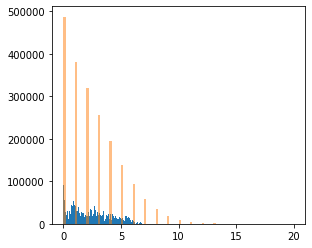

In [14]:
plt.figure(figsize=(10, 4))
plt.subplot(1,2,1)
plt.hist(Ydot.flatten()*n_poisson, 100);
plt.subplot(1,2,1)
plt.hist(Y.flatten()*n_poisson, 100, alpha=0.5);